This notebook prototyped the phase picking of waves using ML model using first the basic EqT, second using the ensemble picker.

In [41]:
from seisbench.models import EQTransformer

import matplotlib.pyplot as plt
from datetime import datetime
from pnwstore.mseed import WaveformClient
import torch
import obspy
from obspy.core.utcdatetime import UTCDateTime
# import sys
# sys.path.append('/data/wsd01/pnwstore/')
import matplotlib.pyplot as plt
# from matplotlib.pyplot import Figure
import numpy as np
import pandas as pd
import obspy
from obspy.core import UTCDateTime
from obspy.clients.fdsn.client import Client
import scipy
from scipy import optimize
from scipy.optimize import curve_fit
from geopy import distance
from datetime import datetime
import rasterio as rio
import torch
plt.rcParams.update({'font.size': 10})
from utils import *
from tqdm import tqdm


import seisbench.models as sbm
device = torch.device("cpu")

from ELEP.elep.ensemble_statistics import ensemble_statistics
from ELEP.elep.ensemble_coherence import ensemble_semblance 
from ELEP.elep.ensemble_learners import ensemble_regressor_cnn
from mbf_elep_func import apply_mbf
from ELEP.elep import mbf, mbf_utils
from ELEP.elep import trigger_func
from ELEP.elep.trigger_func import picks_summary_simple

from ELEP.elep.mbf_utils import make_LogFq, make_LinFq, rec_filter_coeff, create_obspy_trace
from ELEP.elep.mbf import MB_filter as MBF

In [38]:
!pip3 install tqdm

  Cache entry deserialization failed, entry ignored
    100% |████████████████████████████████| 81kB 1.8MB/s ta 0:00:01
Exception:
Traceback (most recent call last):
  File "/usr/lib/python3.6/site-packages/pip/basecommand.py", line 215, in main
    status = self.run(options, args)
  File "/usr/lib/python3.6/site-packages/pip/commands/install.py", line 365, in run
    strip_file_prefix=options.strip_file_prefix,
  File "/usr/lib/python3.6/site-packages/pip/req/req_set.py", line 789, in install
    **kwargs
  File "/usr/lib/python3.6/site-packages/pip/req/req_install.py", line 854, in install
    strip_file_prefix=strip_file_prefix
  File "/usr/lib/python3.6/site-packages/pip/req/req_install.py", line 1069, in move_wheel_files
    strip_file_prefix=strip_file_prefix,
  File "/usr/lib/python3.6/site-packages/pip/wheel.py", line 345, in move_wheel_files
    clobber(source, lib_dir, True)
  File "/usr/lib/python3.6/site-packages/pip/wheel.py", line 316, in clobber
    ensure_dir(destdir)
 

## Download data 

In [5]:
client = WaveformClient()
model = EQTransformer.from_pretrained('original')
model.to(torch.device('cuda'));

In [3]:
s_J25A = client.get_waveforms(network="7D", station="J25A", channel="?H?", year=2012, month=7, day=1)
s_J25A

8 Trace(s) in Stream:
7D.J25A..BH1 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:00.996700Z | 50.0 Hz, 50 samples
7D.J25A..BH1 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:12.916700Z | 50.0 Hz, 646 samples
7D.J25A..BH1 | 2012-07-01T00:00:11.930200Z - 2012-07-01T23:59:59.990200Z | 50.0 Hz, 4319404 samples
7D.J25A..BH2 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:00.996700Z | 50.0 Hz, 50 samples
7D.J25A..BH2 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:12.916700Z | 50.0 Hz, 646 samples
7D.J25A..BH2 | 2012-07-01T00:00:11.930200Z - 2012-07-01T23:59:59.990200Z | 50.0 Hz, 4319404 samples
7D.J25A..BHZ | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:00.996700Z | 50.0 Hz, 50 samples
7D.J25A..BHZ | 2012-07-01T00:00:00.016700Z - 2012-07-01T23:59:59.996700Z | 50.0 Hz, 4320000 samples

In [26]:
s_J25A.filter(type='bandpass',freqmin=4,freqmax=15)

8 Trace(s) in Stream:
7D.J25A..BH1 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:00.996700Z | 50.0 Hz, 50 samples
7D.J25A..BH1 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:12.916700Z | 50.0 Hz, 646 samples
7D.J25A..BH1 | 2012-07-01T00:00:11.930200Z - 2012-07-01T23:59:59.990200Z | 50.0 Hz, 4319404 samples
7D.J25A..BH2 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:00.996700Z | 50.0 Hz, 50 samples
7D.J25A..BH2 | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:12.916700Z | 50.0 Hz, 646 samples
7D.J25A..BH2 | 2012-07-01T00:00:11.930200Z - 2012-07-01T23:59:59.990200Z | 50.0 Hz, 4319404 samples
7D.J25A..BHZ | 2012-07-01T00:00:00.016700Z - 2012-07-01T00:00:00.996700Z | 50.0 Hz, 50 samples
7D.J25A..BHZ | 2012-07-01T00:00:00.016700Z - 2012-07-01T23:59:59.996700Z | 50.0 Hz, 4320000 samples

In [30]:
all_picks, all_detections = model.classify(s_J25A)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
2023-11-08 22:59:29,930 | seisbench | WARNING | Detected multiple records for the same time and component that did not agree. All mismatching traces will be ignored.


In [31]:
for p in all_picks:
    print(p)

7D.J25A.	2012-07-01T02:42:06.006700Z	P
7D.J25A.	2012-07-01T03:22:45.566700Z	P
7D.J25A.	2012-07-01T03:22:49.286700Z	S
7D.J25A.	2012-07-01T03:52:48.136700Z	S
7D.J25A.	2012-07-01T04:14:51.716700Z	S
7D.J25A.	2012-07-01T04:15:05.986700Z	P
7D.J25A.	2012-07-01T04:15:10.736700Z	S
7D.J25A.	2012-07-01T04:22:15.536700Z	P
7D.J25A.	2012-07-01T04:22:31.286700Z	S
7D.J25A.	2012-07-01T05:03:37.766700Z	P
7D.J25A.	2012-07-01T05:07:39.776700Z	P
7D.J25A.	2012-07-01T05:22:40.026700Z	P
7D.J25A.	2012-07-01T05:23:43.506700Z	P
7D.J25A.	2012-07-01T05:23:57.636700Z	S
7D.J25A.	2012-07-01T06:07:11.406700Z	P
7D.J25A.	2012-07-01T06:07:15.846700Z	S
7D.J25A.	2012-07-01T06:14:58.886700Z	P
7D.J25A.	2012-07-01T06:41:56.306700Z	P
7D.J25A.	2012-07-01T06:45:59.856700Z	P
7D.J25A.	2012-07-01T06:46:12.616700Z	S
7D.J25A.	2012-07-01T07:26:36.196700Z	P
7D.J25A.	2012-07-01T07:26:38.296700Z	S
7D.J25A.	2012-07-01T07:27:23.106700Z	P
7D.J25A.	2012-07-01T07:33:11.806700Z	P
7D.J25A.	2012-07-01T07:33:17.026700Z	P
7D.J25A.	2012-07-01T07:33

In [32]:
index = 1 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-07-01T03:22:45.566700Z


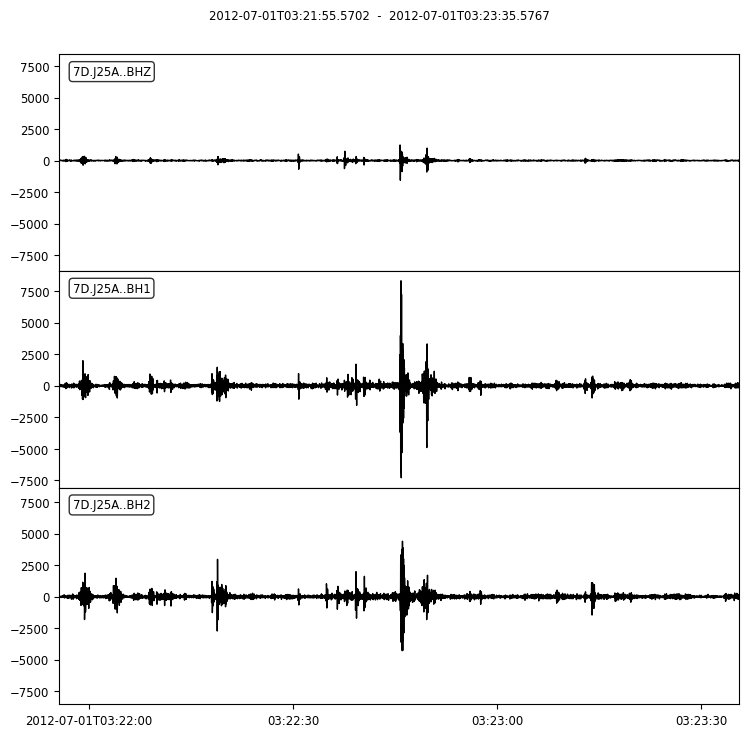

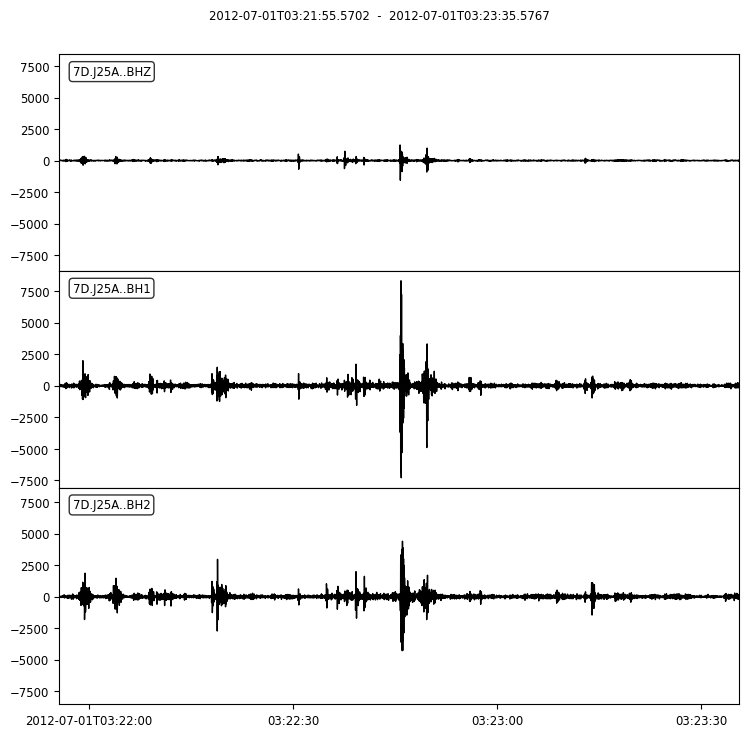

In [33]:
trim_s_J25A = s_J25A.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_J25A.plot()

In [98]:
trim_s_J25A[0].times(type='matplotlib')
data = 

array([15522.14022651, 15522.14022674, 15522.14022697, ...,
       15522.14138345, 15522.14138368, 15522.14138391])

## Test Station J41A

In [34]:
s_J41A = client.get_waveforms(network="7D", station="J41A", channel="?H?", year=2012, month=7, day=1)
s_J41A

3 Trace(s) in Stream:
7D.J41A..HH1 | 2012-07-01T00:00:00.006000Z - 2012-07-02T00:00:01.998000Z | 125.0 Hz, 10800250 samples
7D.J41A..HH2 | 2012-07-01T00:00:00.006000Z - 2012-07-02T00:00:01.998000Z | 125.0 Hz, 10800250 samples
7D.J41A..HHZ | 2012-07-01T00:00:00.006000Z - 2012-07-02T00:00:01.998000Z | 125.0 Hz, 10800250 samples

In [35]:
s_J41A.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.J41A..HH1 | 2012-07-01T00:00:00.006000Z - 2012-07-02T00:00:01.998000Z | 125.0 Hz, 10800250 samples
7D.J41A..HH2 | 2012-07-01T00:00:00.006000Z - 2012-07-02T00:00:01.998000Z | 125.0 Hz, 10800250 samples
7D.J41A..HHZ | 2012-07-01T00:00:00.006000Z - 2012-07-02T00:00:01.998000Z | 125.0 Hz, 10800250 samples

In [36]:
all_picks, all_detections = model.classify(s_J41A)

In [37]:
for p in all_picks:
    print(p)

7D.J41A.	2012-07-01T00:17:04.666000Z	P
7D.J41A.	2012-07-01T00:17:05.006000Z	P
7D.J41A.	2012-07-01T00:17:09.696000Z	S
7D.J41A.	2012-07-01T00:19:53.316000Z	P
7D.J41A.	2012-07-01T00:20:12.446000Z	S
7D.J41A.	2012-07-01T00:23:27.476000Z	P
7D.J41A.	2012-07-01T00:23:28.466000Z	P
7D.J41A.	2012-07-01T00:23:29.486000Z	S
7D.J41A.	2012-07-01T00:25:40.236000Z	P
7D.J41A.	2012-07-01T00:25:49.726000Z	S
7D.J41A.	2012-07-01T00:28:46.946000Z	P
7D.J41A.	2012-07-01T00:33:22.106000Z	P
7D.J41A.	2012-07-01T00:33:23.866000Z	S
7D.J41A.	2012-07-01T00:33:40.366000Z	P
7D.J41A.	2012-07-01T00:33:42.186000Z	S
7D.J41A.	2012-07-01T00:48:11.516000Z	S
7D.J41A.	2012-07-01T00:48:42.786000Z	P
7D.J41A.	2012-07-01T00:48:52.856000Z	S
7D.J41A.	2012-07-01T00:51:52.766000Z	P
7D.J41A.	2012-07-01T00:52:09.656000Z	P
7D.J41A.	2012-07-01T00:55:10.126000Z	P
7D.J41A.	2012-07-01T00:55:14.156000Z	P
7D.J41A.	2012-07-01T00:55:18.526000Z	P
7D.J41A.	2012-07-01T00:55:19.056000Z	S
7D.J41A.	2012-07-01T00:55:54.476000Z	S
7D.J41A.	2012-07-01T00:56

In [38]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-07-01T00:17:04.666000Z


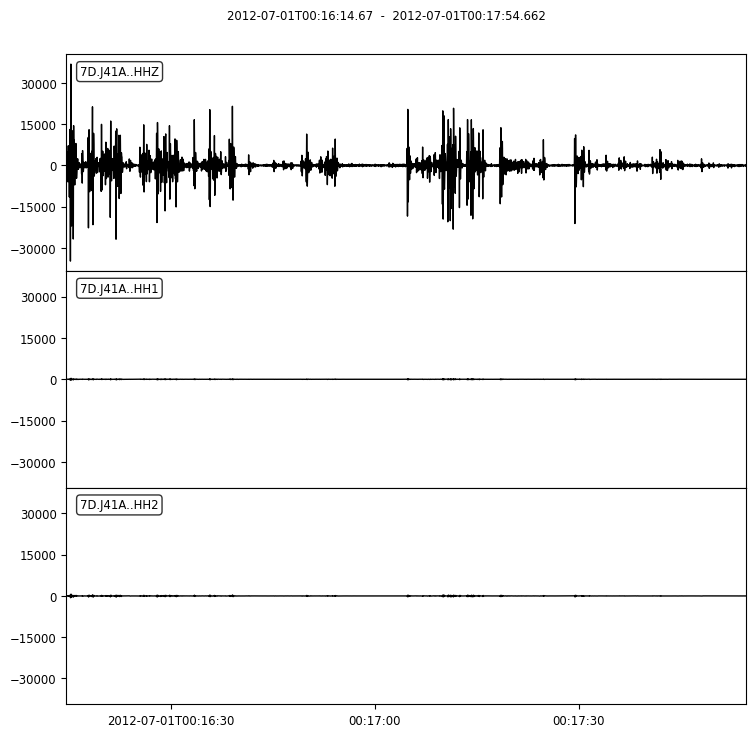

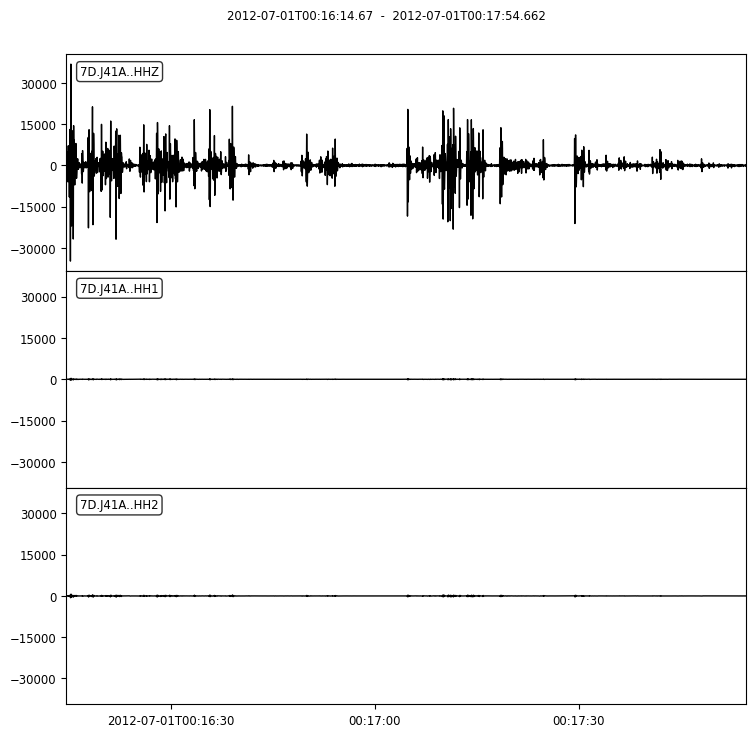

In [39]:
trim_s_J41A = s_J41A.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_J41A.plot()

## Test Station J57A

In [6]:
s_J57A = client.get_waveforms(network="7D", station="J57A", channel="?H?", year=2012, month=7, day=2)
s_J57A

3 Trace(s) in Stream:
7D.J57A..BH1 | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples
7D.J57A..BH2 | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples
7D.J57A..BHZ | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples

In [7]:
s_J57A.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.J57A..BH1 | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples
7D.J57A..BH2 | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples
7D.J57A..BHZ | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples

## Applying the EQTransformer

In [8]:
all_picks, all_detections = model.classify(s_J57A)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)


In [9]:
for p in all_picks:
    print(p)

7D.J57A.	2012-07-02T01:51:48.533900Z	P
7D.J57A.	2012-07-02T01:51:50.143900Z	S
7D.J57A.	2012-07-02T02:01:56.393900Z	P
7D.J57A.	2012-07-02T17:28:19.853900Z	P
7D.J57A.	2012-07-02T17:28:23.963900Z	S


In [10]:
for p in all_detections:
    print(p)

7D.J57A.	2012-07-02T01:51:48.373900Z	2012-07-02T01:51:51.533900Z
7D.J57A.	2012-07-02T17:28:22.313900Z	2012-07-02T17:28:25.363900Z


In [11]:
index = 1 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This S phase is picked at 2012-07-02T01:51:50.143900Z


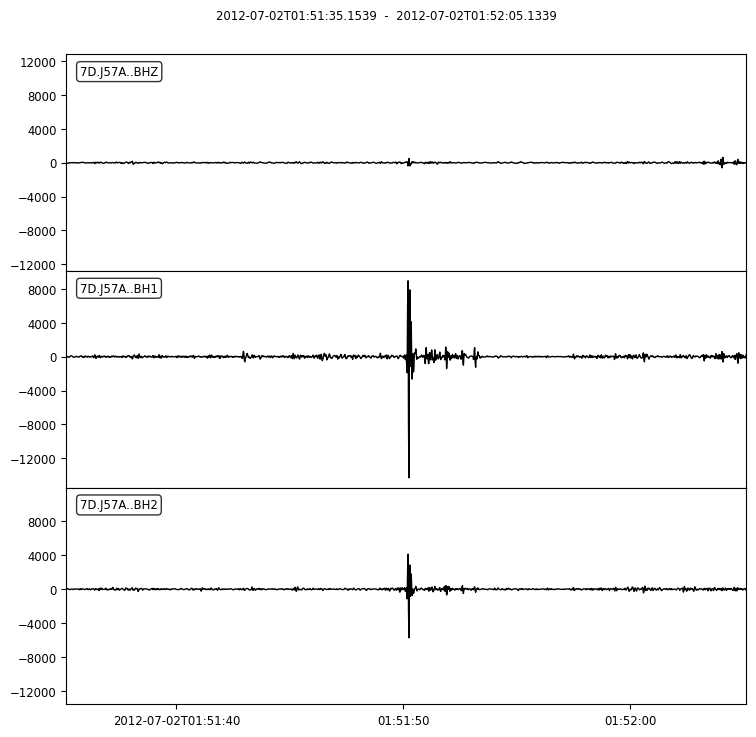

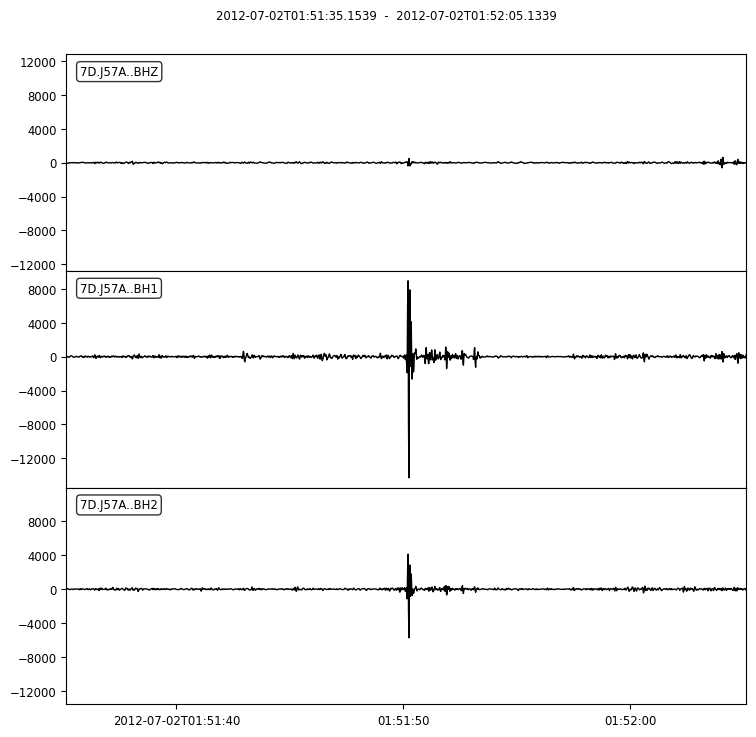

In [12]:
trim_s_J57A = s_J57A.copy().trim(starttime = UTCDateTime(pick.peak_time) - 15, 
                endtime = UTCDateTime(pick.peak_time) + 15)
trim_s_J57A.plot()
# if pick.phase == P:
#     plt.axvline()

In [10]:
start_time = start_time_temp = [  datetime.strptime(str(x.peak_time),'%Y-%m-%dT%H:%M:%S.%fZ') for x in all_picks]

In [11]:
start_time

[datetime.datetime(2012, 7, 2, 1, 51, 48, 533900),
 datetime.datetime(2012, 7, 2, 1, 51, 50, 143900),
 datetime.datetime(2012, 7, 2, 2, 1, 56, 393900),
 datetime.datetime(2012, 7, 2, 17, 28, 19, 853900),
 datetime.datetime(2012, 7, 2, 17, 28, 23, 963900)]

## Try ELEP
Referencing Marine and Yiyu's notebook (Ensemble phase picking (continuous waveform, broadband): https://github.com/Denolle-Lab/surface_events/blob/marine_cleanup_branch/src/SU_seismic_infrasound_MtRainier.ipynb and https://github.com/congcy/ELEP/blob/main/docs/tutorials/example_BB_continuous_data_PB_B204.ipynb.

In [83]:
# define clients to download the station data
# client = WaveformClient() # we ignore PNWdatastore for now
# client2 = Client('IRIS')

# t_before = 15 #number of seconds before pick time
# # t_after = 15 #number of seconds after pick time
# t_before_raw = 1200 #number of seconds before pick time before removing instrumental response
# # t_after_raw = 1200 #number of seconds after pick time before removing instrumental response
# t_around = 10
# fs = 50 #sampling rate that all waveforms are resampled to
# window = 150 #window length of the signal (this will help with phase picking with EqT next). 
# # Use 150 seconds @ 40 Hz gives 6001 points. 
# pr = 98 #percentile
thr = 5 #SNR threshold
# station_distance_threshold = 25
# pi = np.pi
# v_s = 1000 #shear wave velocity at the surface

# # range of dates that we are looking at
# t_beginning = UTCDateTime(2001,1,1,0,0,0) 
# t_end = UTCDateTime(2023,8,2,23,59)
# twin=6000

# smooth_length = 5 # constant for smoothing the waveform envelopes
low_cut = 1 #low frequency threshold
high_cut = 12 #high frequency threshold
# az_thr = 1000 #threshold of distance in meters from source location
# step = 100 #step every 100 m
# t_step = 1 #step every second
# ratio = 5.6915196 #used to define the grid 
# colors = list(plt.cm.tab10(np.arange(10)))*3
# radius = 6371e3 # radius of the earth

fs = s_J57A[0].stats.sampling_rate

In [84]:
# ML picker parameters
# paras_semblance = {'dt':1/fs, 'semblance_order':4, 'window_flag':True, 
#                    'semblance_win':0.5, 'weight_flag':'max'}
p_thrd, s_thrd = 0.01, 0.05

In [85]:
# download models
pretrain_list = ["pnw","ethz","instance","scedc","stead","geofon","neic"]
pn_pnw_model = sbm.EQTransformer.from_pretrained('pnw')
pn_ethz_model = sbm.EQTransformer.from_pretrained("ethz")
pn_instance_model = sbm.EQTransformer.from_pretrained("instance")
pn_scedc_model = sbm.EQTransformer.from_pretrained("scedc")
pn_stead_model = sbm.EQTransformer.from_pretrained("stead")
pn_geofon_model = sbm.EQTransformer.from_pretrained("geofon")
pn_neic_model = sbm.EQTransformer.from_pretrained("neic")

list_models = [pn_pnw_model,pn_ethz_model,pn_scedc_model,pn_neic_model,pn_geofon_model,pn_stead_model,pn_instance_model]


In [86]:
pn_pnw_model.to(device);
pn_ethz_model.to(device);
pn_scedc_model.to(device);
pn_neic_model.to(device);
pn_geofon_model.to(device);
pn_stead_model.to(device);
pn_instance_model.to(device);

In [87]:
fqmin = low_cut
fqmax = high_cut
dt = 1/fs
nfqs = 10
nt = 6000; nc = 3
fq_list = make_LogFq(fqmin, fqmax, dt, nfqs)
coeff_HP, coeff_LP = rec_filter_coeff(fq_list, dt)
MBF_paras = {'f_min':fqmin, 'f_max':fqmax, 'nfqs':nfqs, 'frequencies':fq_list, 'CN_HP':coeff_HP, 'CN_LP':coeff_LP, \
    'dt':dt, 'fs':fs, 'nt':nt, 'nc':nc, 'npoles': 2}

In [88]:
twin = 6000     # length of time window
step = 3000     # step length
npts = sdata.shape[1]
l_blnd, r_blnd = 500, 500
nseg = int(np.ceil((npts - twin) / step)) + 1
windows = np.zeros(shape=(nseg, 3, twin), dtype= np.float32)
tap = 0.5 * (1 + np.cos(np.linspace(np.pi, 2 * np.pi, 6)))


windows_std = np.zeros(shape=(nseg, 3, twin), dtype= np.float32)
windows_max = np.zeros(shape=(nseg, 3, twin), dtype= np.float32)
windows = np.zeros(shape=(nseg, 3, twin), dtype= np.float32)
windows_idx = np.zeros(nseg, dtype=np.int32)

for iseg in range(nseg):
    idx = iseg * step
    windows[iseg, :] = sdata[:, idx:idx + twin]
    windows[iseg, :] -= np.mean(windows[iseg, :], axis=-1, keepdims=True)
    # original use std norm
    windows_std[iseg, :] = windows[iseg, :] / np.std(windows[iseg, :]) + 1e-10
    # others use max norm
    windows_max[iseg, :] = windows[iseg, :] / (np.max(np.abs(windows[iseg, :]), axis=-1, keepdims=True))
    windows_idx[iseg] = idx

# taper
windows_std[:, :, :6] *= tap; windows_std[:, :, -6:] *= tap[::-1]; 
windows_max[:, :, :6] *= tap; windows_max[:, :, -6:] *= tap[::-1];
del windows

In [89]:
s_J57A 
np.array(s_J57A)

array([[ 2.19335595e+02,  6.77880139e+02,  2.69101392e+02, ...,
        -6.20806245e+00,  1.34319491e+00,  2.25555141e+00],
       [-9.85028796e+01, -3.21581121e+02, -1.92802966e+02, ...,
        -1.23328886e+00,  1.17416513e+01,  2.13125827e+01],
       [-7.79279806e+02, -2.41434157e+03, -9.75518621e+02, ...,
        -2.69354972e+00, -7.08707731e+00, -5.00000661e+00]])

In [67]:
s_J57A

3 Trace(s) in Stream:
7D.J57A..BH1 | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples
7D.J57A..BH2 | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples
7D.J57A..BHZ | 2012-07-02T00:00:00.013900Z - 2012-07-02T23:59:59.993900Z | 50.0 Hz, 4320000 samples

In [68]:
import time 
import gc

In [22]:
sdata = np.array(s_J57A)

In [28]:
sdata.shape

(3, 4320000)

In [90]:
pretrain_list = ['original', 'ethz', 'instance', 'scedc', 'stead', 'neic']

# dim 0: 0 = P, 1 = S
batch_pred = np.zeros([2, len(pretrain_list), nseg, twin], dtype = np.float32) 

for ipre, pretrain in enumerate(pretrain_list):
    t0 = time.time()
    eqt = sbm.EQTransformer.from_pretrained(pretrain)
    eqt.to(device);
    eqt._annotate_args['overlap'] = ('Overlap between prediction windows in samples \
                                    (only for window prediction models)', step)
    eqt._annotate_args['blinding'] = ('Number of prediction samples to discard on \
                                     each side of each window prediction', (l_blnd, r_blnd))
    eqt.eval();
    if pretrain == 'original':
        # batch prediction through torch model
        windows_std_tt = torch.Tensor(windows_std)
        _torch_pred = eqt(windows_std_tt.to(device))
    else:
        windows_max_tt = torch.Tensor(windows_max)
        _torch_pred = eqt(windows_max_tt.to(device))
    batch_pred[0, ipre, :] = _torch_pred[1].detach().cpu().numpy()
    batch_pred[1, ipre, :] = _torch_pred[2].detach().cpu().numpy()
    
    t1 = time.time()
    print(f"picking using [{pretrain}] model: %.3f second" % (t1 - t0))
    
# clean up memory
del _torch_pred, windows_max_tt, windows_std_tt
del windows_std, windows_max
gc.collect()
torch.cuda.empty_cache()

print(f"All prediction shape: {batch_pred.shape}")

picking using [original] model: 1.814 second
picking using [ethz] model: 1.041 second
picking using [instance] model: 0.975 second
picking using [scedc] model: 1.865 second
picking using [stead] model: 1.042 second
picking using [neic] model: 1.039 second
All prediction shape: (2, 6, 1439, 6000)


In [91]:
def stacking(data, npts, l_blnd, r_blnd):
    _data = data.copy()
    stack = np.full(npts, np.nan, dtype = np.float32)
    _data[:, :l_blnd] = np.nan; _data[:, -r_blnd:] = np.nan
    stack[:twin] = _data[0, :]
    for iseg in range(nseg-1):
        idx = step*(iseg+1)
        stack[idx:idx + twin] = \
                np.nanmax([stack[idx:idx + twin], _data[iseg+1, :]], axis = 0)
    return stack

In [92]:
pretrain_pred = np.zeros([2, len(pretrain_list), npts], dtype = np.float32)
for ipre, pretrain in enumerate(pretrain_list):
    # 0 for P-wave
    pretrain_pred[0, ipre, :] = stacking(batch_pred[0, ipre, :], npts, l_blnd, r_blnd)
    
    # 1 for S-wave
    pretrain_pred[1, ipre, :] = stacking(batch_pred[1, ipre, :], npts, l_blnd, r_blnd)

/tmp/ipykernel_664914/1491012717.py:9: RuntimeWarning: All-NaN axis encountered
  np.nanmax([stack[idx:idx + twin], _data[iseg+1, :]], axis = 0)


Text(0.5, 0, 'Time')

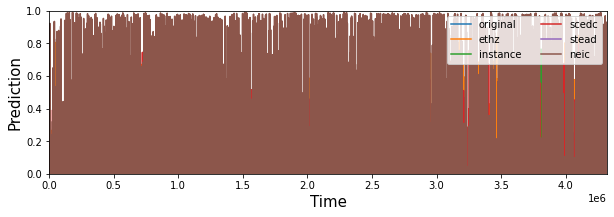

In [93]:
plt.figure(figsize = (10, 3))
for ipre, pretrain in enumerate(pretrain_list):
    plt.plot(pretrain_pred[0, ipre, :], label = pretrain)
plt.ylabel("Prediction", fontsize = 15); plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.legend(ncols = 2, loc = 'upper right')
plt.xlabel("Time", fontsize = 15)

## 4 ensemble calculation

In [94]:
paras_maximum = {'dt':1/fs, 'win':1, 'window_flag':False, 'method':'max'}
paras_semblance = {'dt':1/fs, 'semblance_order':2, 'window_flag':True, 
                   'semblance_win':0.5, 'weight_flag':'max'}
p_thrd, s_thrd = 0.05, 0.05

max_pred = np.zeros([2, nseg, twin], dtype = np.float32)
smb_pred = np.zeros([2, nseg, twin], dtype = np.float32)

In [95]:
# calculate the ensemble maximum and semblance
## the semblance may takes a while bit to calculate
for iseg in tqdm(range(nseg)):
    # 0 for P-wave
    max_pred[0, iseg, :] = ensemble_statistics(batch_pred[0, :, iseg, :], paras_maximum)
    smb_pred[0, iseg, :] = ensemble_semblance(batch_pred[0, :, iseg, :], paras_semblance)
    
    # 1 for P-wave
    max_pred[1, iseg, :] = ensemble_statistics(batch_pred[1, :, iseg, :], paras_maximum)
    smb_pred[1, iseg, :] = ensemble_semblance(batch_pred[1, :, iseg, :], paras_semblance)

## ... and stack
# 0 for P-wave
max_p = stacking(max_pred[0, :], npts, l_blnd, r_blnd)
smb_p = stacking(smb_pred[0, :], npts, l_blnd, r_blnd)

# 1 for P-wave
max_s = stacking(max_pred[1, :], npts, l_blnd, r_blnd)
smb_s = stacking(smb_pred[1, :], npts, l_blnd, r_blnd)

# clean-up RAM
del max_pred, smb_pred, batch_pred

100%|██████████| 1439/1439 [01:23<00:00, 17.32it/s]
/tmp/ipykernel_664914/1491012717.py:9: RuntimeWarning: All-NaN axis encountered
  np.nanmax([stack[idx:idx + twin], _data[iseg+1, :]], axis = 0)


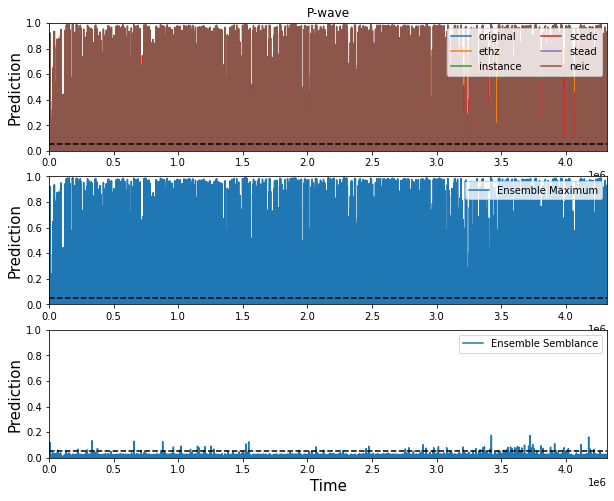

In [96]:
plt.figure(figsize = (10, 8))
plt.subplot(3, 1, 1)
plt.title("P-wave")
for ipre, pretrain in enumerate(pretrain_list):
    plt.plot(pretrain_pred[0, ipre, :], label = pretrain)
plt.ylabel("Prediction", fontsize = 15); 
plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.hlines(p_thrd, 0, npts, linestyle = '--', color = 'k')
plt.legend(ncols = 2, loc = 'upper right')

plt.subplot(3, 1, 2)
plt.plot(max_p, label = "Ensemble Maximum")
plt.ylabel("Prediction", fontsize = 15); 
plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.hlines(p_thrd, 0, npts, linestyle = '--', color = 'k')
plt.legend(loc = 'upper right')

plt.subplot(3, 1, 3)
plt.plot(smb_p, label = "Ensemble Semblance")
plt.xlabel("Time", fontsize = 15); plt.ylabel("Prediction", fontsize = 15); 
plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.hlines(p_thrd, 0, npts, linestyle = '--', color = 'k')
plt.legend(loc = 'upper right')

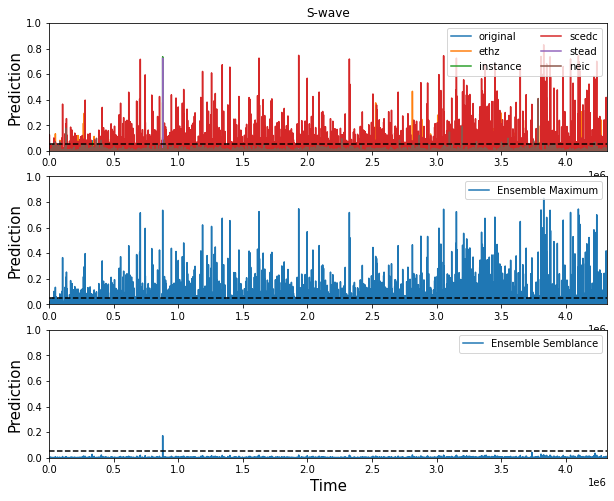

In [97]:
plt.figure(figsize = (10, 8))
plt.subplot(3, 1, 1)
plt.title("S-wave")
for ipre, pretrain in enumerate(pretrain_list):
    plt.plot(pretrain_pred[1, ipre, :], label = pretrain)
plt.ylabel("Prediction", fontsize = 15); 
plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.legend(ncols = 2, loc = 'upper right')
plt.hlines(s_thrd, 0, npts, linestyle = '--', color = 'k')

plt.subplot(3, 1, 2)
plt.plot(max_s, label = "Ensemble Maximum")
plt.ylabel("Prediction", fontsize = 15); 
plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.hlines(s_thrd, 0, npts, linestyle = '--', color = 'k')
plt.legend(loc = 'upper right')


plt.subplot(3, 1, 3)
plt.plot(smb_s, label = "Ensemble Semblance")
plt.xlabel("Time", fontsize = 15); plt.ylabel("Prediction", fontsize = 15); 
plt.ylim([0, 1]); plt.xlim([0, npts]);
plt.hlines(s_thrd, 0, npts, linestyle = '--', color = 'k')
plt.legend(loc = 'upper right')

## Picking and catalog

In [98]:
p_index = picks_summary_simple(smb_p, p_thrd)
s_index = picks_summary_simple(smb_s, s_thrd)
print(f"{len(p_index)} P picks\n{len(s_index)} S picks")

84 P picks
1 S picks


In [99]:
# Define the start time and delta that are needed in the next cell
delta = s_J57A[0].stats.delta
starttime = s_J57A[0].stats.starttime

/tmp/ipykernel_664914/2584090198.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10, 2))


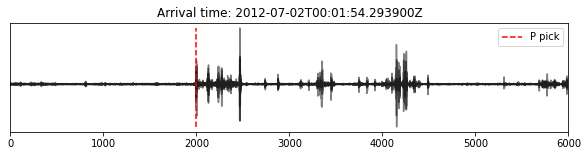

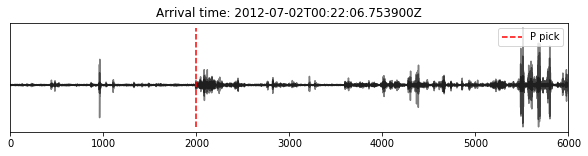

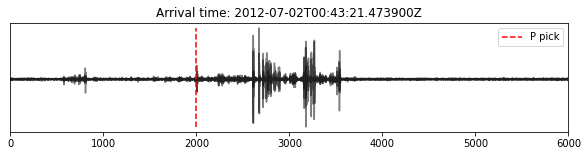

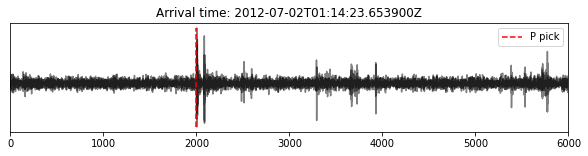

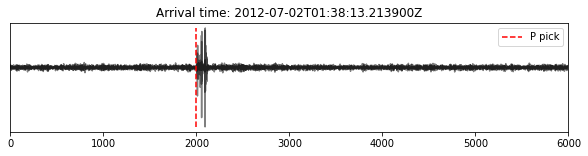

...

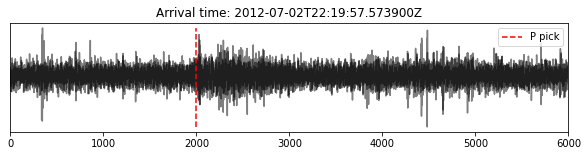

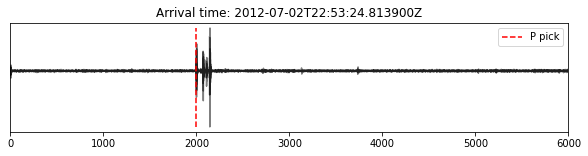

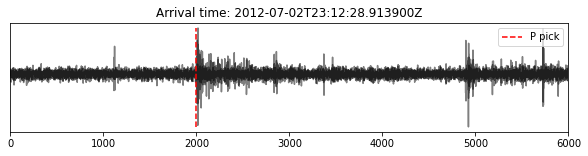

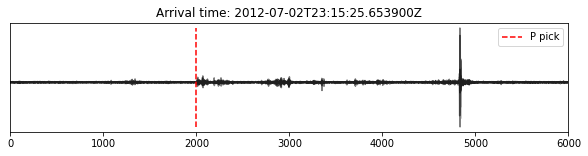

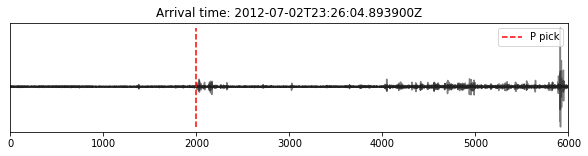

In [100]:
## all picks for this station and this day by PNSN
catalog = pd.read_csv("https://github.com/congcy/ELEP/raw/main/docs/tutorials/data/PB.B204.2022.037.csv")
catalog = catalog[catalog['phase'] == 'P']

## gray waveform: there is a pick by PNSN within 1 second
## black waveform: probably a new event detected
for idx in p_index:
    arrival_utc = starttime + idx * delta
    plt.figure(figsize = (10, 2))
    w = sdata[:, idx-2000:idx+4000]
    nearby_pick = abs(arrival_utc.timestamp - catalog['timestamp']) < 1
    if nearby_pick.any():
        dt = np.abs(catalog.loc[nearby_pick]['timestamp'] - arrival_utc.timestamp)
        plt.plot(w.T, color = 'gray', alpha = 0.5)
        plt.vlines(2000, w.min(), w.max(), linestyle = '--', color = 'r', 
                   label=f'P pick \n$\\Delta t = $%.3f sec' % dt.values[0])
    else:
        plt.plot(w.T, color = 'black', alpha = 0.5)
        plt.vlines(2000, w.min(), w.max(), linestyle = '--', color = 'r', label = 'P pick')
    plt.title(f"Arrival time: {arrival_utc}")
    plt.yticks([]); plt.legend(loc = 'upper right')
    plt.xlim([0, 6000])

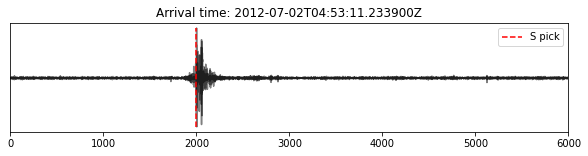

In [101]:
## all picks for this station and this day by PNSN
catalog = pd.read_csv("https://github.com/congcy/ELEP/raw/main/docs/tutorials/data/PB.B204.2022.037.csv")
catalog = catalog[catalog['phase'] == 'S']

## gray waveform: there is a pick by PNSN within 1 second
## black waveform: probably a new event detected
for idx in s_index:
    arrival_utc = starttime + idx * delta
    plt.figure(figsize = (10, 2))
    w = sdata[:, idx-2000:idx+4000]
    nearby_pick = abs(arrival_utc.timestamp - catalog['timestamp']) < 1
    if nearby_pick.any():
        dt = np.abs(catalog.loc[nearby_pick]['timestamp'] - arrival_utc.timestamp)
        plt.plot(w.T, color = 'gray', alpha = 0.5)
        plt.vlines(2000, w.min(), w.max(), linestyle = '--', color = 'r', 
                   label=f'S pick \n$\\Delta t = $%.3f sec' % dt.values[0])
    else:
        plt.plot(w.T, color = 'black', alpha = 0.5)
        plt.vlines(2000, w.min(), w.max(), linestyle = '--', color = 'r', label = 'S pick')
    plt.title(f"Arrival time: {arrival_utc}")
    plt.yticks([]); plt.legend(loc = 'upper right')
    plt.xlim([0, 6000])

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.8/site-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.8/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.8/site-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


NameError: name 'otime' is not defined

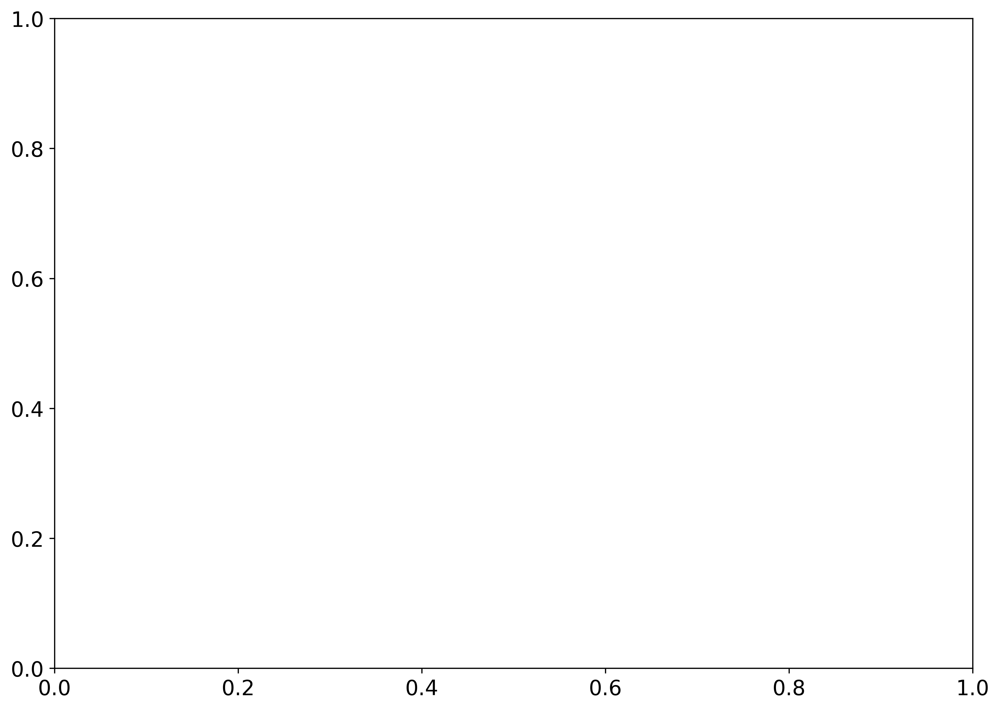

In [19]:
from matplotlib.backends.backend_pdf import PdfPages
pdf = PdfPages('../plots/Seis_offshore.pdf')
nfigure=0



#resampling the data to 40Hz for each trace
#     infra = resample(infra,fs) 

# #Plotting all traces for one event with channel z, SNR>10, and bandpasses between 2-12Hz
evt_data = obspy.Stream()
#     evt_infradata = obspy.Stream()
SNR,SNR_weight, no_weight,stas,nets,max_amp_times,durations,data_env_dict,t_diff = [],[],[],[],[],[],[],{},{}
nfigure+=1
# if nfigure<50:
fig = plt.figure(figsize = (11,8), dpi=400)
#     fig.suptitle(str(otime)+" "+stations[n])
plt.rcParams.update({'font.size': 14})
ax = plt.subplot(1,1,1)
iplot = 0
for i,ii in enumerate(zz):
    network = ii.stats.network
    station = ii.stats.station
    ii.detrend(type = 'demean')
    ii.filter('bandpass',freqmin=low_cut,freqmax=high_cut,corners=2,zerophase=True)
    signal_window = ii.copy()
    noise_window = ii.copy()
    signal_window.trim(UTCDateTime(start_time[i]) - t_before, UTCDateTime(start_time[i]) - t_before + window) # trim the signal at the first pick time of the PNSN data, with loose 40s before
    noise_window.trim(UTCDateTime(start_time[i])- window -t_before, UTCDateTime(start_time[i]) - t_before) # noise window of the same length
    if not len(signal_window.data) or not len(signal_window.data): continue
    snr = (20 * np.log(np.percentile(np.abs(signal_window.data),pr) 
                    / np.percentile(np.abs(noise_window.data),pr))/np.log(10))
    max_amp_time = np.argmax(noise_window.data)/fs
    if snr<thr: 
        st.remove(ii)
        continue
    evt_data.append(signal_window)
    stas.append(ii.stats.station)
    t = signal_window.times()
    if nfigure<50:
        ax.plot(t-t_before,signal_window.data/np.max(np.abs(signal_window.data))+iplot*1.5)
        ax.set_xlabel('time (seconds)')
        ax.set_xlim((-t_before,100))
        ax.set_yticks([])
        plt.text(80, iplot*1.5, station)
        iplot += 1

sta_available,ind = np.unique(np.array(stas),return_index=True)
sta_available=sta_available[np.argsort(ind)]
# if len(sta_available)==0:continue
#       Plot the infrasound as well

#     evt_infradata = obspy.Stream()
#     stas_infra=[]
#     for i,ii in enumerate(infra):
#         ii.filter('bandpass',freqmin=low_cut,freqmax=high_cut-5,corners=2,zerophase=True)
#         signal_window = ii.copy()
#         signal_window.trim(otime - t_before, otime - t_before  + window) # trim the signal at the first pick time of the PNSN data, with loose 40s before
#         if not len(signal_window.data): continue
#         t1 = signal_window.times()
#         if nfigure<50:
#             ax.plot(t1-t_before,signal_window.data/np.max(np.abs(signal_window.data))+iplot*1.5,color='0.8',linewidth=0.8)
#             ax.text(80, iplot*1.5, signal_window.stats.station)
#             iplot+=1
#             ax.set_xlim((-t_before,100))
#         evt_infradata.append(signal_window)
#         stas_infra.append(ii.stats.station)

#     sta_infra_available,ind = np.unique(np.array(stas_infra),return_index=True)
#     sta_infra_available=sta_infra_available[np.argsort(ind)]
#     if len(sta_infra_available)==0:continue

# PHASE PICKING
    # test the new function
smb_peak,smb_peak_mbf = apply_mbf(evt_data, sta_available, \
        list_models, MBF_paras, paras_semblance, t_before,t_around)
#     smb_peak_infra,smb_peak_mbf_infra = apply_mbf(evt_infradata, sta_infra_available, \
#             list_models, MBF_paras, paras_semblance, t_before+40,t_around+40)

print("reference time: ",otime)
print("relative picks from seismometers")
print(sta_available)
print(smb_peak_mbf)
#     print("relative picks from infrasound")
#     print(sta_infra_available)
#     print(smb_peak_mbf_infra)

if nfigure<50:
    iplot=0
    for i in range(len(sta_available)):
        ax.vlines(smb_peak_mbf[i], ymin = iplot*1.5-.5, ymax = iplot*1.5+.5, color = 'r')
        iplot+=1
#         for i in range(len(sta_infra_available)):
#             if np.abs(smb_peak_mbf_infra[i])>0.5:
#                 ax.vlines(smb_peak_mbf_infra[i]+40, ymin = iplot*1.5-.5, ymax = iplot*1.5+.5, color = 'r')
#             iplot+=1

    plt.grid(True)
    pdf.savefig(fig)
    print("Plotted")
    fig.savefig('../plots/waveforms_seismic_infrasound_'+event_ID+associated_volcano+'.png')
    plt.show()
    del fig
    nfigure+=1

if nfigure==50 :pdf.close()


    

# except:
#     pass



In [38]:
start_time[0]

datetime.datetime(2012, 7, 2, 1, 51, 48, 533900)

reference time:  2012-07-02T01:51:48.533900Z
relative picks from seismometers
['J57A']
[0.]
Plotted


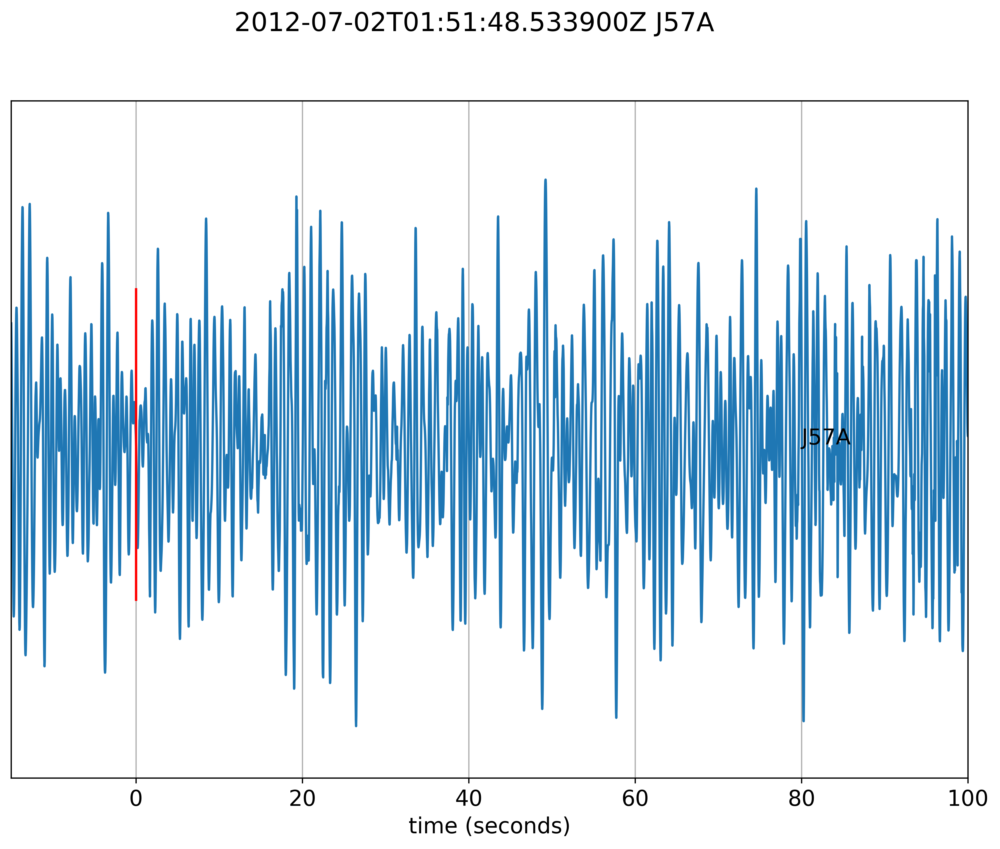

reference time:  2012-07-02T01:51:50.143900Z
relative picks from seismometers
['J57A']
[0.]
Plotted


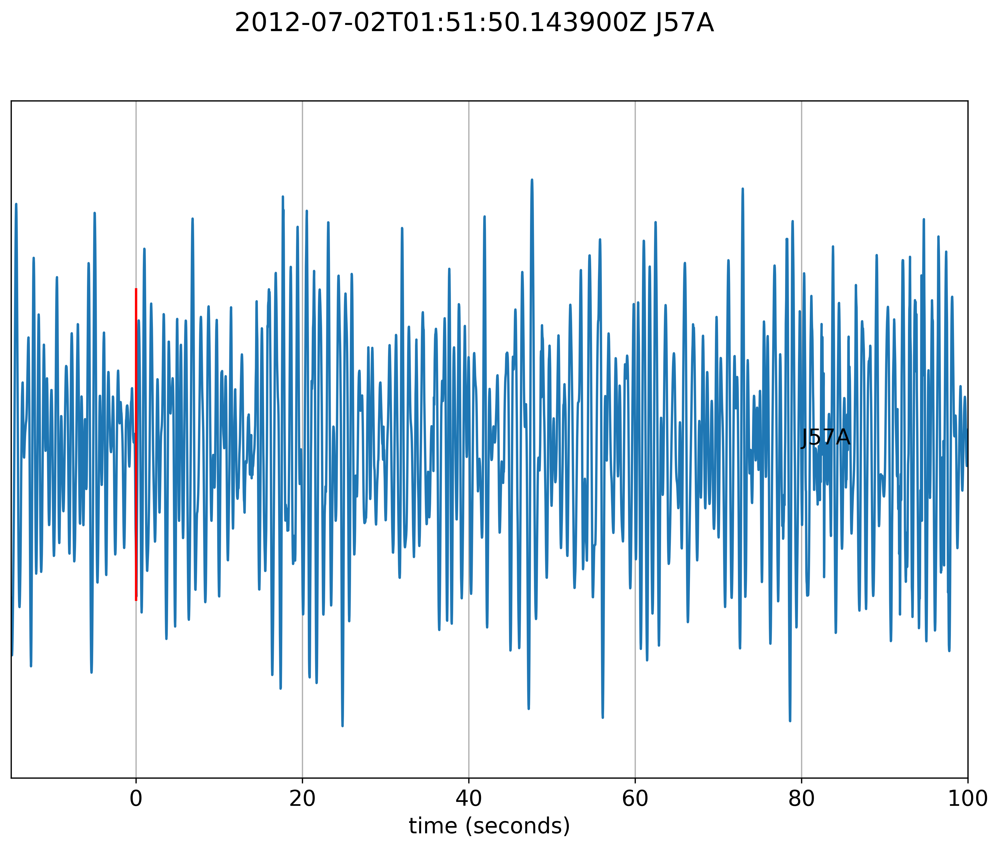

reference time:  2012-07-02T02:01:56.393900Z
relative picks from seismometers
['J57A']
[0.]
Plotted


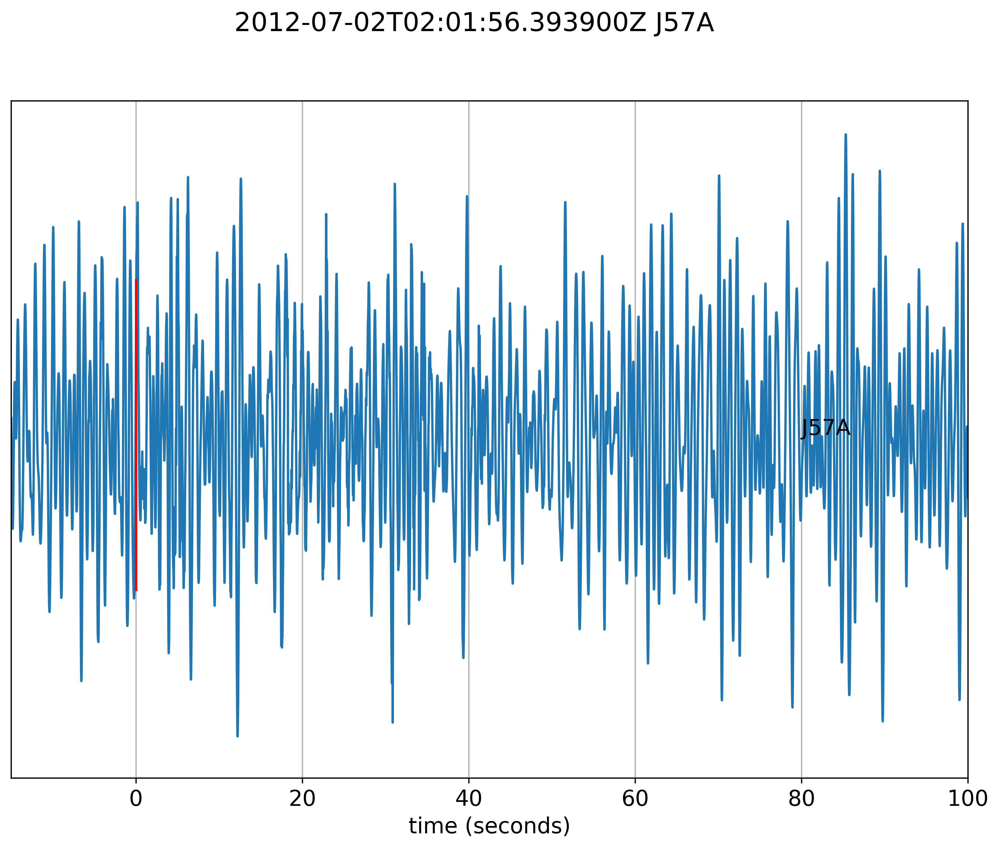

reference time:  2012-07-02T17:28:19.853900Z
relative picks from seismometers
['J57A']
[0.]
Plotted


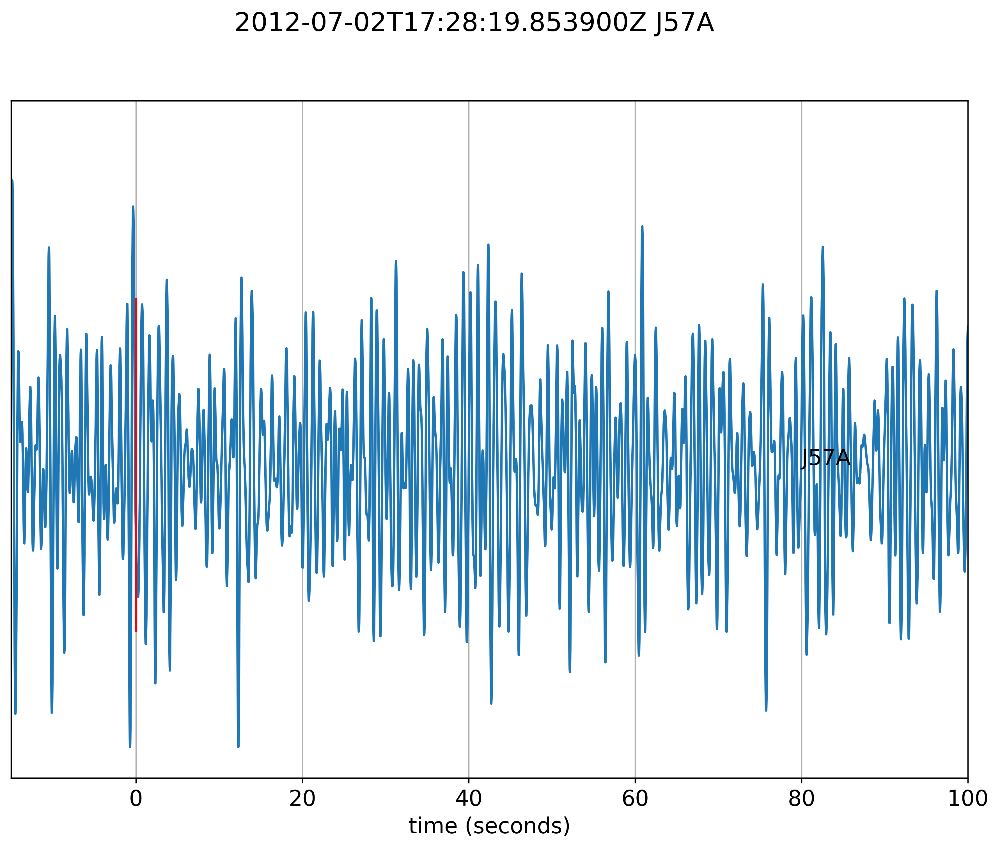

reference time:  2012-07-02T17:28:23.963900Z
relative picks from seismometers
['J57A']
[0.]
Plotted


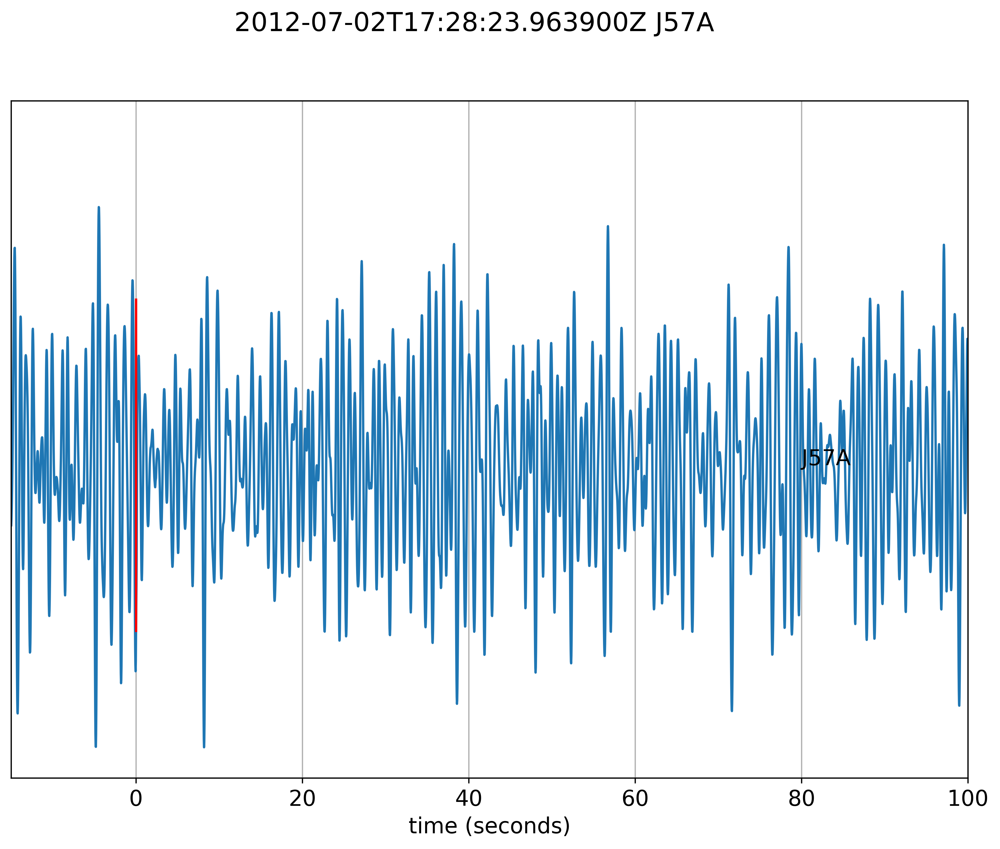

In [33]:
from matplotlib.backends.backend_pdf import PdfPages
pdf = PdfPages('../plots/Seis_offshore.pdf')
nfigure=0
station = 'J57A'
for n in range(len(start_time)):
        
#     if start_time[n]<datetime(2021,1,1):continue  
#     event_ID = str(evt_id[n])
    otime = UTCDateTime(start_time[n])
#     networks=net[n]
#     stations=sta[n]
#     print(net[n],sta[n])
#     if sta[n]=="LON" or sta[n]=="LO2": continue
#     try:
#         associated_volcano = df[df['Station']== sta[n]]['Volcano_Name'].values[0]
#     except:
#         pass
#     if associated_volcano!="Mt_Rainier":continue            
#     # get info for stations within 50km of volcano that event ocurred at
#     stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
#     networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
#     latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
#     longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
#     elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()

    #################### WAVEFORM DOWNLOAD #######################
        #Download all waveforms for that event based on stations and times
    # try:
    st = client2.get_waveforms('7D', 'J57A', '*', '*H*', otime-t_before_raw, otime+t_before_raw)

    #     bulk2=[]
    #     for m in range(0, len(df_infra["Station"])):
    #         bulk2.append(["CC", df_infra["Station"][m], '01', 'BDF', otime-t_before_raw, otime+t_before_raw])
    #     infra = client2.get_waveforms_bulk(bulk2)
    #remove unwanted data
    for tr in st:
        cha = tr.stats.channel
        try:
            if len(tr.data)/tr.stats.sampling_rate < 239.9:
                st.remove(tr)
        except:
            pass

    #resampling the data to 40Hz for each trace
    st = resample(st,fs) 
    #     infra = resample(infra,fs) 

    # #Plotting all traces for one event with channel z, SNR>10, and bandpasses between 2-12Hz
    evt_data = obspy.Stream()
    #     evt_infradata = obspy.Stream()
    SNR,SNR_weight, no_weight,stas,nets,max_amp_times,durations,data_env_dict,t_diff = [],[],[],[],[],[],[],{},{}
    nfigure+=1
    if nfigure<50:
        fig = plt.figure(figsize = (11,8), dpi=400)
        fig.suptitle(str(otime)+" "+station)
        plt.rcParams.update({'font.size': 14})
        ax = plt.subplot(1,1,1)
        iplot = 0
    zz = st.select(component="Z")
    for i,ii in enumerate(zz):
        network = ii.stats.network
        station = ii.stats.station
        ii.detrend(type = 'demean')
        ii.filter('bandpass',freqmin=low_cut,freqmax=high_cut,corners=2,zerophase=True)
        signal_window = ii.copy()
        noise_window = ii.copy()
        signal_window.trim(otime - t_before, otime - t_before + window) # trim the signal at the first pick time of the PNSN data, with loose 40s before
        noise_window.trim(otime- window -t_before, otime - t_before) # noise window of the same length
#         if not len(signal_window.data) or not len(signal_window.data): continue
        snr = (20 * np.log(np.percentile(np.abs(signal_window.data),pr) 
                        / np.percentile(np.abs(noise_window.data),pr))/np.log(10))
        max_amp_time = np.argmax(noise_window.data)/fs
#         if snr<thr: 
#             st.remove(ii)
#             continue
        evt_data.append(signal_window)
        stas.append(ii.stats.station)
        t = signal_window.times()
#         if nfigure<50:
        ax.plot(t-t_before,signal_window.data/np.max(np.abs(signal_window.data))+iplot*1.5)
        ax.set_xlabel('time (seconds)')
        ax.set_xlim((-t_before,100))
        ax.set_yticks([])
        plt.text(80, iplot*1.5, station)
        iplot += 1

    sta_available,ind = np.unique(np.array(stas),return_index=True)
    sta_available=sta_available[np.argsort(ind)]
    # if len(sta_available)==0:continue
    #       Plot the infrasound as well

    #     evt_infradata = obspy.Stream()
    #     stas_infra=[]
    #     for i,ii in enumerate(infra):
    #         ii.filter('bandpass',freqmin=low_cut,freqmax=high_cut-5,corners=2,zerophase=True)
    #         signal_window = ii.copy()
    #         signal_window.trim(otime - t_before, otime - t_before  + window) # trim the signal at the first pick time of the PNSN data, with loose 40s before
    #         if not len(signal_window.data): continue
    #         t1 = signal_window.times()
    #         if nfigure<50:
    #             ax.plot(t1-t_before,signal_window.data/np.max(np.abs(signal_window.data))+iplot*1.5,color='0.8',linewidth=0.8)
    #             ax.text(80, iplot*1.5, signal_window.stats.station)
    #             iplot+=1
    #             ax.set_xlim((-t_before,100))
    #         evt_infradata.append(signal_window)
    #         stas_infra.append(ii.stats.station)

    #     sta_infra_available,ind = np.unique(np.array(stas_infra),return_index=True)
    #     sta_infra_available=sta_infra_available[np.argsort(ind)]
    #     if len(sta_infra_available)==0:continue

    # PHASE PICKING
        # test the new function
    smb_peak,smb_peak_mbf = apply_mbf(evt_data, sta_available, \
            list_models, MBF_paras, paras_semblance, t_before,t_around)
    #     smb_peak_infra,smb_peak_mbf_infra = apply_mbf(evt_infradata, sta_infra_available, \
    #             list_models, MBF_paras, paras_semblance, t_before+40,t_around+40)

    print("reference time: ",otime)
    print("relative picks from seismometers")
    print(sta_available)
    print(smb_peak_mbf)
    #     print("relative picks from infrasound")
    #     print(sta_infra_available)
    #     print(smb_peak_mbf_infra)

    if nfigure<50:
        iplot=0
        for i in range(len(sta_available)):
            ax.vlines(smb_peak_mbf[i], ymin = iplot*1.5-.5, ymax = iplot*1.5+.5, color = 'r')
            iplot+=1
    #         for i in range(len(sta_infra_available)):
    #             if np.abs(smb_peak_mbf_infra[i])>0.5:
    #                 ax.vlines(smb_peak_mbf_infra[i]+40, ymin = iplot*1.5-.5, ymax = iplot*1.5+.5, color = 'r')
    #             iplot+=1

        plt.grid(True)
        pdf.savefig(fig)
        print("Plotted")
        fig.savefig('../plots/waveforms_seismic_infrasound_'+str(otime)+'.png')
        plt.show()
        del fig
        nfigure+=1

    if nfigure==50 :pdf.close()




    # except:
    #     pass



## Test M09B

In [47]:
s_M09B = client.get_waveforms(network="7D", station="M09B", channel="?H?", year=2012, month=7, day=30)
s_M09B

3 Trace(s) in Stream:
7D.M09B..HH1 | 2012-07-30T00:00:00.005000Z - 2012-07-30T23:59:59.997000Z | 125.0 Hz, 10800000 samples
7D.M09B..HH2 | 2012-07-30T00:00:00.005000Z - 2012-07-30T23:59:59.997000Z | 125.0 Hz, 10800000 samples
7D.M09B..HHZ | 2012-07-30T00:00:00.005000Z - 2012-07-30T23:59:59.997000Z | 125.0 Hz, 10800000 samples

In [48]:
s_M09B.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.M09B..HH1 | 2012-07-30T00:00:00.005000Z - 2012-07-30T23:59:59.997000Z | 125.0 Hz, 10800000 samples
7D.M09B..HH2 | 2012-07-30T00:00:00.005000Z - 2012-07-30T23:59:59.997000Z | 125.0 Hz, 10800000 samples
7D.M09B..HHZ | 2012-07-30T00:00:00.005000Z - 2012-07-30T23:59:59.997000Z | 125.0 Hz, 10800000 samples

In [49]:
all_picks, all_detections = model.classify(s_M09B)

In [50]:
for p in all_picks:
    print(p)

7D.M09B.	2012-07-30T00:15:40.695000Z	P
7D.M09B.	2012-07-30T00:15:44.175000Z	S
7D.M09B.	2012-07-30T00:20:29.275000Z	P
7D.M09B.	2012-07-30T00:20:39.245000Z	S
7D.M09B.	2012-07-30T00:44:43.295000Z	P
7D.M09B.	2012-07-30T00:44:43.725000Z	S
7D.M09B.	2012-07-30T00:44:55.455000Z	S
7D.M09B.	2012-07-30T00:49:31.355000Z	P
7D.M09B.	2012-07-30T00:49:37.145000Z	S
7D.M09B.	2012-07-30T00:50:14.725000Z	S
7D.M09B.	2012-07-30T00:57:43.565000Z	P
7D.M09B.	2012-07-30T00:57:45.885000Z	S
7D.M09B.	2012-07-30T01:26:24.005000Z	P
7D.M09B.	2012-07-30T01:26:27.565000Z	S
7D.M09B.	2012-07-30T01:33:10.915000Z	S
7D.M09B.	2012-07-30T01:33:17.205000Z	S
7D.M09B.	2012-07-30T02:09:35.755000Z	P
7D.M09B.	2012-07-30T02:09:43.615000Z	S
7D.M09B.	2012-07-30T02:10:57.135000Z	S
7D.M09B.	2012-07-30T02:20:00.905000Z	P
7D.M09B.	2012-07-30T02:20:04.505000Z	S
7D.M09B.	2012-07-30T02:20:23.375000Z	P
7D.M09B.	2012-07-30T02:29:00.405000Z	P
7D.M09B.	2012-07-30T02:29:02.205000Z	S
7D.M09B.	2012-07-30T02:53:39.665000Z	P
7D.M09B.	2012-07-30T02:53

In [51]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-07-30T00:15:40.695000Z


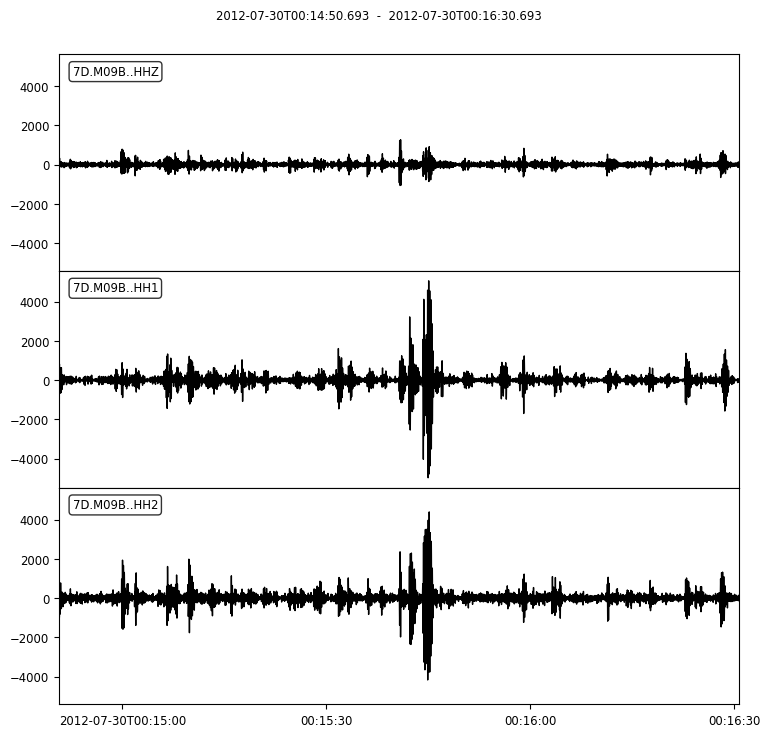

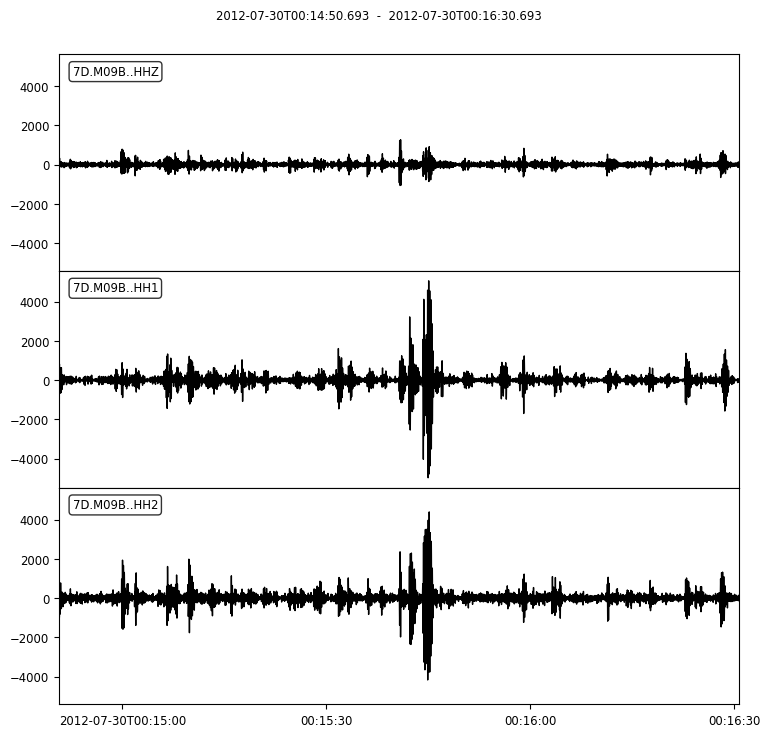

In [52]:
trim_s_M09B = s_M09B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_M09B.plot()

## Test J25B

In [54]:
s_J25B = client.get_waveforms(network="7D", station="J25B", channel="?H?", year=2012, month=7, day=30)
s_J25B

3 Trace(s) in Stream:
7D.J25B..HH1 | 2012-07-30T00:00:00.000400Z - 2012-07-30T23:59:59.992400Z | 125.0 Hz, 10800000 samples
7D.J25B..HH2 | 2012-07-30T00:00:00.000400Z - 2012-07-30T23:59:59.992400Z | 125.0 Hz, 10800000 samples
7D.J25B..HHZ | 2012-07-30T00:00:00.000400Z - 2012-07-30T23:59:59.992400Z | 125.0 Hz, 10800000 samples

In [55]:
s_J25B.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.J25B..HH1 | 2012-07-30T00:00:00.000400Z - 2012-07-30T23:59:59.992400Z | 125.0 Hz, 10800000 samples
7D.J25B..HH2 | 2012-07-30T00:00:00.000400Z - 2012-07-30T23:59:59.992400Z | 125.0 Hz, 10800000 samples
7D.J25B..HHZ | 2012-07-30T00:00:00.000400Z - 2012-07-30T23:59:59.992400Z | 125.0 Hz, 10800000 samples

In [56]:
all_picks, all_detections = model.classify(s_J25B)

In [57]:
for p in all_picks:
    print(p)

7D.J25B.	2012-07-30T00:04:56.790400Z	P
7D.J25B.	2012-07-30T00:05:01.510400Z	S
7D.J25B.	2012-07-30T00:05:51.080400Z	S
7D.J25B.	2012-07-30T00:10:44.370400Z	P
7D.J25B.	2012-07-30T00:10:44.480400Z	S
7D.J25B.	2012-07-30T00:16:28.440400Z	S
7D.J25B.	2012-07-30T00:16:48.970400Z	S
7D.J25B.	2012-07-30T00:23:50.180400Z	P
7D.J25B.	2012-07-30T00:23:51.790400Z	S
7D.J25B.	2012-07-30T00:33:37.990400Z	P
7D.J25B.	2012-07-30T00:33:41.060400Z	P
7D.J25B.	2012-07-30T00:33:43.250400Z	S
7D.J25B.	2012-07-30T01:32:09.960400Z	P
7D.J25B.	2012-07-30T01:32:10.110400Z	S
7D.J25B.	2012-07-30T01:34:46.320400Z	P
7D.J25B.	2012-07-30T01:34:47.550400Z	S
7D.J25B.	2012-07-30T01:41:54.070400Z	S
7D.J25B.	2012-07-30T01:54:42.990400Z	P
7D.J25B.	2012-07-30T01:54:43.800400Z	S
7D.J25B.	2012-07-30T02:23:07.940400Z	P
7D.J25B.	2012-07-30T02:23:08.970400Z	P
7D.J25B.	2012-07-30T02:23:09.610400Z	S
7D.J25B.	2012-07-30T02:33:35.020400Z	S
7D.J25B.	2012-07-30T02:48:22.070400Z	S
7D.J25B.	2012-07-30T02:51:10.460400Z	P
7D.J25B.	2012-07-30T02:51

In [58]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-07-30T00:04:56.790400Z


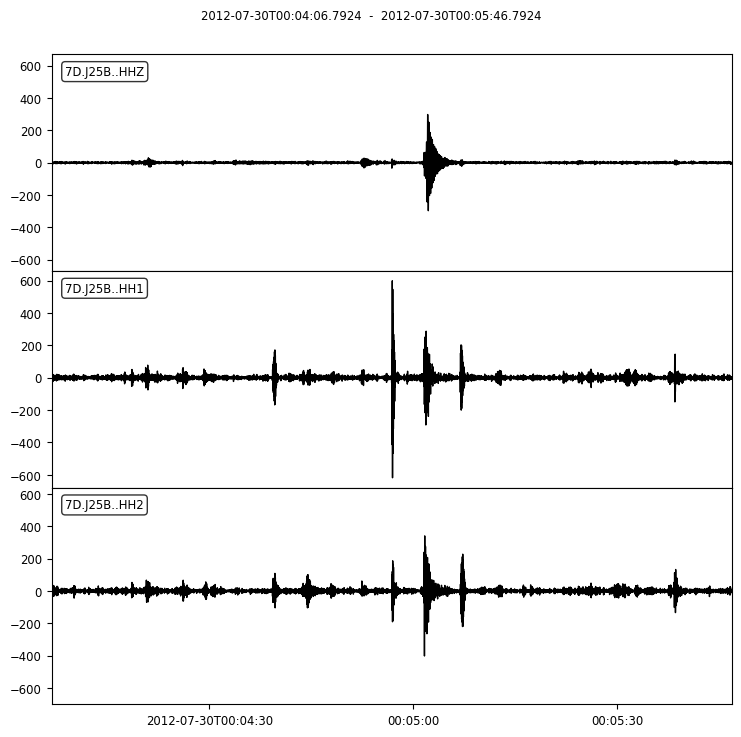

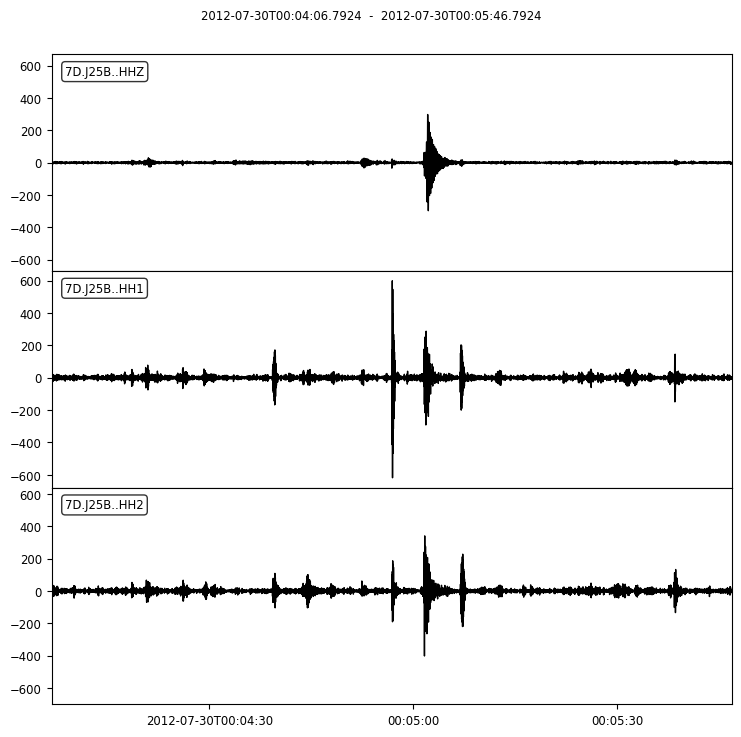

In [59]:
trim_s_J25B = s_J25B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_J25B.plot()

## Test Station G10B

In [60]:
s_G10B = client.get_waveforms(network="7D", station="G10B", channel="?H?", year=2012, month=9, day=3)
s_G10B

3 Trace(s) in Stream:
7D.G10B..BH1 | 2012-09-03T15:08:07.949486Z - 2012-09-03T23:59:59.989486Z | 50.0 Hz, 1595603 samples
7D.G10B..BH2 | 2012-09-03T15:08:07.949486Z - 2012-09-03T23:59:59.989486Z | 50.0 Hz, 1595603 samples
7D.G10B..BHZ | 2012-09-03T15:08:07.949486Z - 2012-09-03T23:59:59.989486Z | 50.0 Hz, 1595603 samples

In [61]:
s_G10B.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.G10B..BH1 | 2012-09-03T15:08:07.949486Z - 2012-09-03T23:59:59.989486Z | 50.0 Hz, 1595603 samples
7D.G10B..BH2 | 2012-09-03T15:08:07.949486Z - 2012-09-03T23:59:59.989486Z | 50.0 Hz, 1595603 samples
7D.G10B..BHZ | 2012-09-03T15:08:07.949486Z - 2012-09-03T23:59:59.989486Z | 50.0 Hz, 1595603 samples

In [62]:
all_picks, all_detections = model.classify(s_G10B)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)


In [63]:
for p in all_picks:
    print(p)

7D.G10B.	2012-09-03T16:15:09.349486Z	S
7D.G10B.	2012-09-03T19:02:49.639486Z	P
7D.G10B.	2012-09-03T19:03:55.429486Z	P
7D.G10B.	2012-09-03T19:03:57.679486Z	S
7D.G10B.	2012-09-03T19:04:21.339486Z	P
7D.G10B.	2012-09-03T19:05:56.249486Z	P
7D.G10B.	2012-09-03T19:05:59.719486Z	S
7D.G10B.	2012-09-03T19:25:25.999486Z	P
7D.G10B.	2012-09-03T19:25:31.149486Z	S
7D.G10B.	2012-09-03T20:50:04.859486Z	P
7D.G10B.	2012-09-03T20:50:09.249486Z	S
7D.G10B.	2012-09-03T21:04:35.579486Z	P
7D.G10B.	2012-09-03T21:04:44.259486Z	S
7D.G10B.	2012-09-03T22:19:37.599486Z	P
7D.G10B.	2012-09-03T22:19:39.519486Z	S
7D.G10B.	2012-09-03T22:19:53.879486Z	P
7D.G10B.	2012-09-03T22:19:55.829486Z	S
7D.G10B.	2012-09-03T22:54:26.209486Z	P
7D.G10B.	2012-09-03T22:54:39.079486Z	S
7D.G10B.	2012-09-03T23:30:29.629486Z	P
7D.G10B.	2012-09-03T23:30:43.539486Z	S
7D.G10B.	2012-09-03T23:30:54.999486Z	S
7D.G10B.	2012-09-03T23:31:01.619486Z	S
7D.G10B.	2012-09-03T23:53:42.949486Z	P
7D.G10B.	2012-09-03T23:53:50.329486Z	S


In [64]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This S phase is picked at 2012-09-03T16:15:09.349486Z


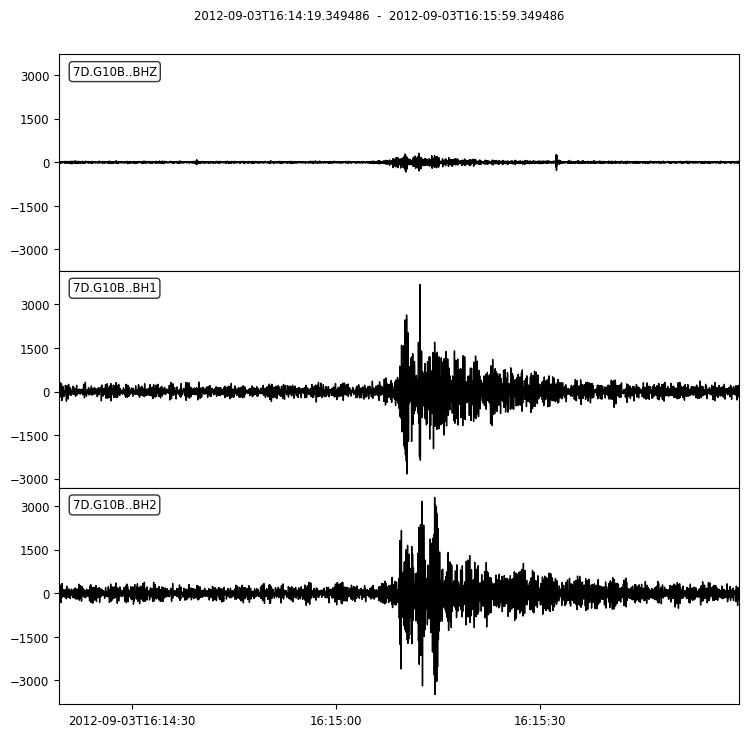

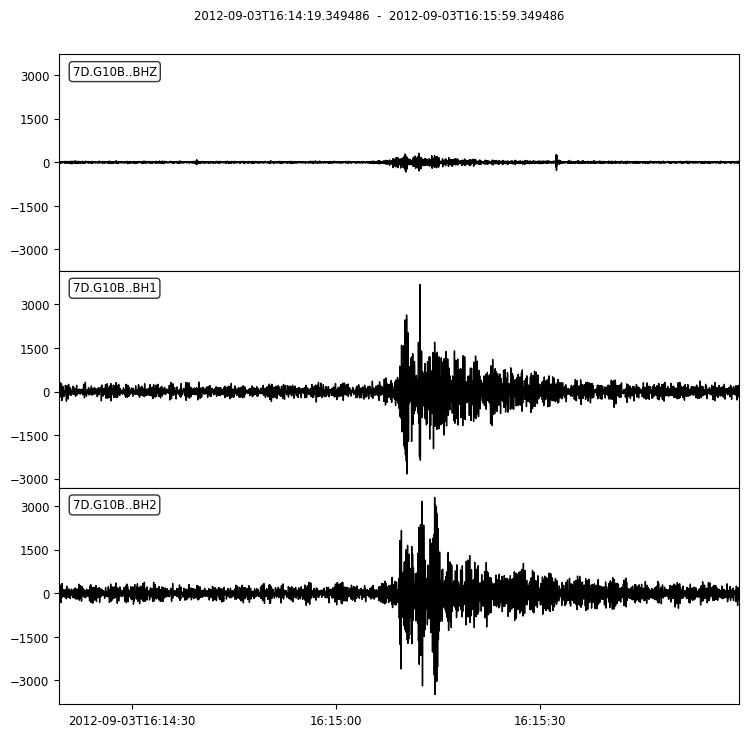

In [66]:
trim_s_G10B = s_G10B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_G10B.plot()

## Test Station FS09B

In [67]:
s_FS09B= client.get_waveforms(network="7D", station="FS09B", channel="?H?", year=2012, month=8, day=28)
s_FS09B

6 Trace(s) in Stream:
7D.FS09B..BH1 | 2012-08-28T00:00:56.900000Z - 2012-08-29T00:00:00.000000Z | 50.0 Hz, 4317156 samples
7D.FS09B..BH2 | 2012-08-28T00:00:58.340000Z - 2012-08-29T00:00:00.000000Z | 50.0 Hz, 4317084 samples
7D.FS09B..BHZ | 2012-08-28T00:01:00.180000Z - 2012-08-29T00:00:00.000000Z | 50.0 Hz, 4316992 samples
7D.FS09B..LH1 | 2012-08-28T00:35:50.000000Z - 2012-08-29T00:00:00.000000Z | 1.0 Hz, 84251 samples
7D.FS09B..LH2 | 2012-08-28T00:37:36.000000Z - 2012-08-29T00:00:00.000000Z | 1.0 Hz, 84145 samples
7D.FS09B..LHZ | 2012-08-28T00:37:17.000000Z - 2012-08-29T00:00:00.000000Z | 1.0 Hz, 84164 samples

In [68]:
s_FS09B.filter(type='bandpass',freqmin=4,freqmax=15)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (15) of bandpass is at or above Nyquist (0.5). Applying a high-pass instead.
  warnings.warn(msg)


ValueError: Selected corner frequency is above Nyquist.

In [59]:
all_picks, all_detections = model.classify(s_FS09B)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (0.5). Applying a high-pass instead.
  warnings.warn(msg)


ValueError: Selected corner frequency is above Nyquist.

In [ ]:
for p in all_picks:
    print(p)

In [6]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-07-01T09:27:49.166700Z


In [ ]:
trim_s_FS09B = s_FS09B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_FS09B.plot()

## Test Station FS13B

In [69]:
s_FS13B = client.get_waveforms(network="7D", station="FS13B", channel="?H?", year=2012, month=9, day=30)
s_FS13B

3 Trace(s) in Stream:
7D.FS13B..HH1 | 2012-09-30T00:00:00.004600Z - 2012-09-30T23:59:59.996600Z | 125.0 Hz, 10800000 samples
7D.FS13B..HH2 | 2012-09-30T00:00:00.004600Z - 2012-09-30T23:59:59.996600Z | 125.0 Hz, 10800000 samples
7D.FS13B..HHZ | 2012-09-30T00:00:00.004600Z - 2012-09-30T23:59:59.996600Z | 125.0 Hz, 10800000 samples

In [70]:
s_FS13B.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.FS13B..HH1 | 2012-09-30T00:00:00.004600Z - 2012-09-30T23:59:59.996600Z | 125.0 Hz, 10800000 samples
7D.FS13B..HH2 | 2012-09-30T00:00:00.004600Z - 2012-09-30T23:59:59.996600Z | 125.0 Hz, 10800000 samples
7D.FS13B..HHZ | 2012-09-30T00:00:00.004600Z - 2012-09-30T23:59:59.996600Z | 125.0 Hz, 10800000 samples

In [71]:
all_picks, all_detections = model.classify(s_FS13B)

In [72]:
for p in all_picks:
    print(p)

7D.FS13B.	2012-09-30T00:33:19.974600Z	S
7D.FS13B.	2012-09-30T00:40:02.784600Z	P
7D.FS13B.	2012-09-30T00:40:04.034600Z	S
7D.FS13B.	2012-09-30T00:51:29.394600Z	P
7D.FS13B.	2012-09-30T00:51:36.484600Z	S
7D.FS13B.	2012-09-30T01:10:05.014600Z	P
7D.FS13B.	2012-09-30T01:10:05.994600Z	P
7D.FS13B.	2012-09-30T01:10:17.304600Z	S
7D.FS13B.	2012-09-30T01:15:38.004600Z	P
7D.FS13B.	2012-09-30T01:15:47.604600Z	S
7D.FS13B.	2012-09-30T01:46:41.104600Z	P
7D.FS13B.	2012-09-30T01:55:35.004600Z	S
7D.FS13B.	2012-09-30T02:03:16.904600Z	S
7D.FS13B.	2012-09-30T02:05:40.614600Z	P
7D.FS13B.	2012-09-30T02:06:03.074600Z	P
7D.FS13B.	2012-09-30T02:06:11.584600Z	S
7D.FS13B.	2012-09-30T02:07:42.024600Z	P
7D.FS13B.	2012-09-30T02:09:13.844600Z	P
7D.FS13B.	2012-09-30T02:09:16.054600Z	S
7D.FS13B.	2012-09-30T02:12:05.004600Z	P
7D.FS13B.	2012-09-30T02:12:13.614600Z	S
7D.FS13B.	2012-09-30T02:13:45.754600Z	P
7D.FS13B.	2012-09-30T02:15:45.954600Z	S
7D.FS13B.	2012-09-30T02:23:06.964600Z	P
7D.FS13B.	2012-09-30T02:23:08.974600Z	P


In [73]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This S phase is picked at 2012-09-30T00:33:19.974600Z


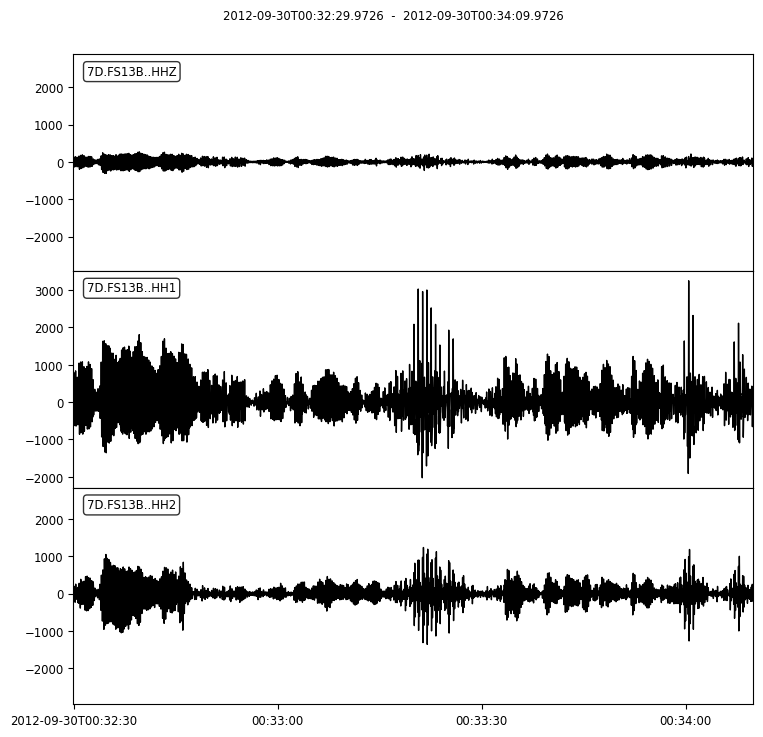

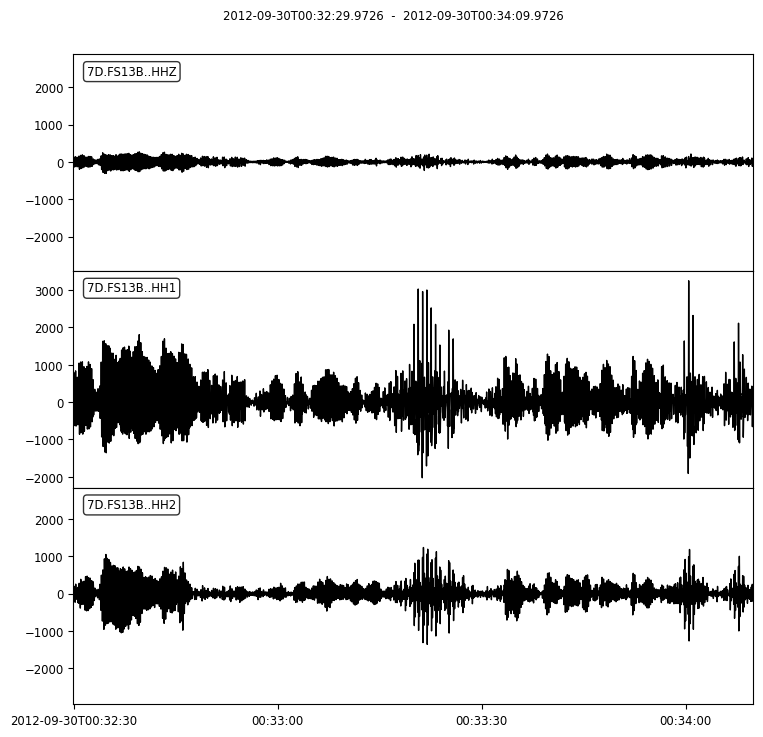

In [74]:
trim_s_FS13B = s_FS13B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_FS13B.plot()
# s_FS13B[1].plot(type="dayplot")

## Test Station FS16B

In [75]:
s_FS16B = client.get_waveforms(network="7D", station="FS16B", channel="?H?", year=2012, month=9, day=30)
s_FS16B

3 Trace(s) in Stream:
7D.FS16B..HH1 | 2012-09-30T00:00:00.002200Z - 2012-09-30T23:59:59.994200Z | 125.0 Hz, 10800000 samples
7D.FS16B..HH2 | 2012-09-30T00:00:00.002200Z - 2012-09-30T23:59:59.994200Z | 125.0 Hz, 10800000 samples
7D.FS16B..HHZ | 2012-09-30T00:00:00.002200Z - 2012-09-30T23:59:59.994200Z | 125.0 Hz, 10800000 samples

In [76]:
s_FS16B.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.FS16B..HH1 | 2012-09-30T00:00:00.002200Z - 2012-09-30T23:59:59.994200Z | 125.0 Hz, 10800000 samples
7D.FS16B..HH2 | 2012-09-30T00:00:00.002200Z - 2012-09-30T23:59:59.994200Z | 125.0 Hz, 10800000 samples
7D.FS16B..HHZ | 2012-09-30T00:00:00.002200Z - 2012-09-30T23:59:59.994200Z | 125.0 Hz, 10800000 samples

In [77]:
all_picks, all_detections = model.classify(s_FS16B)

In [78]:
for p in all_picks:
    print(p)

7D.FS16B.	2012-09-30T00:04:56.232200Z	P
7D.FS16B.	2012-09-30T00:04:56.442200Z	S
7D.FS16B.	2012-09-30T00:26:44.992200Z	P
7D.FS16B.	2012-09-30T00:26:48.342200Z	S
7D.FS16B.	2012-09-30T00:27:13.582200Z	S
7D.FS16B.	2012-09-30T01:05:50.832200Z	P
7D.FS16B.	2012-09-30T01:05:55.512200Z	S
7D.FS16B.	2012-09-30T01:08:09.032200Z	P
7D.FS16B.	2012-09-30T01:08:22.432200Z	S
7D.FS16B.	2012-09-30T01:19:46.972200Z	S
7D.FS16B.	2012-09-30T02:13:51.612200Z	P
7D.FS16B.	2012-09-30T02:14:05.512200Z	S
7D.FS16B.	2012-09-30T02:15:30.142200Z	S
7D.FS16B.	2012-09-30T02:20:19.572200Z	S
7D.FS16B.	2012-09-30T02:21:06.982200Z	P
7D.FS16B.	2012-09-30T02:21:07.982200Z	P
7D.FS16B.	2012-09-30T02:21:12.292200Z	S
7D.FS16B.	2012-09-30T04:12:29.332200Z	S
7D.FS16B.	2012-09-30T05:18:32.582200Z	P
7D.FS16B.	2012-09-30T05:34:21.502200Z	P
7D.FS16B.	2012-09-30T05:34:21.652200Z	S
7D.FS16B.	2012-09-30T05:41:35.002200Z	P
7D.FS16B.	2012-09-30T05:41:39.222200Z	S
7D.FS16B.	2012-09-30T06:12:16.992200Z	P
7D.FS16B.	2012-09-30T06:12:26.572200Z	S


In [79]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-09-30T00:04:56.232200Z


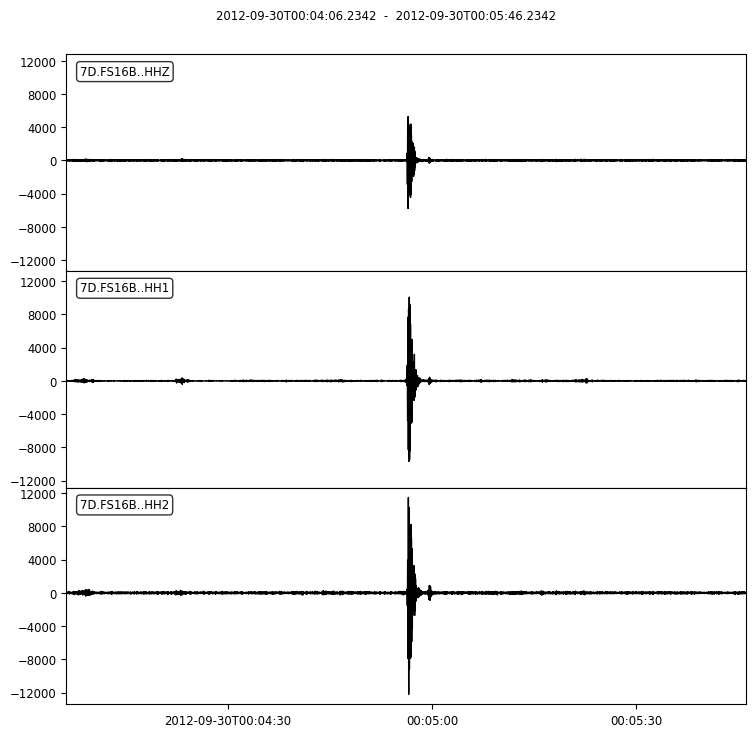

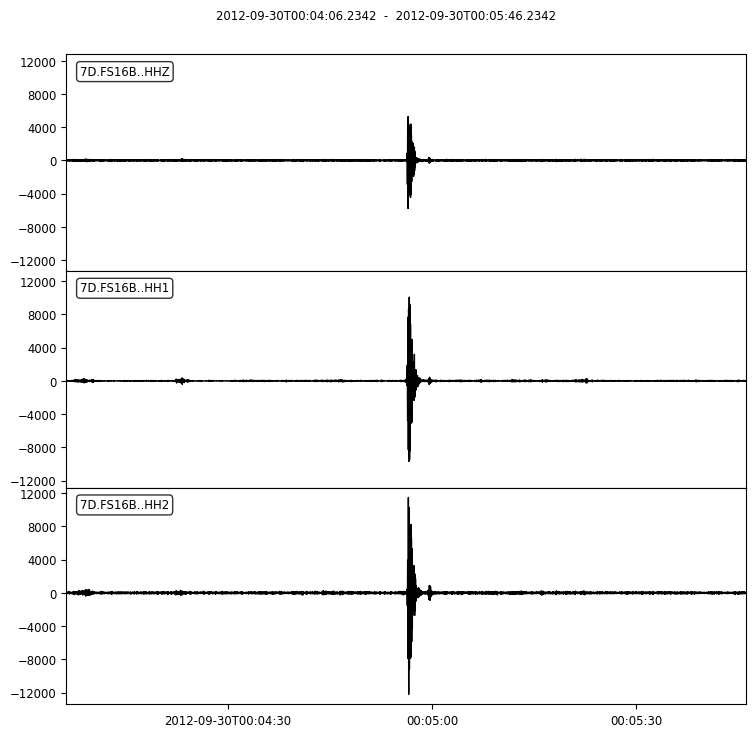

In [80]:
trim_s_FS16B = s_FS16B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_FS16B.plot()

## Test Station G19B

In [81]:
s_G19B = client.get_waveforms(network="7D", station="G19B", channel="?H?", year=2012, month=9, day=1)
s_G19B

6 Trace(s) in Stream:
7D.G19B..BH1 | 2012-09-01T00:00:00.000200Z - 2012-09-01T23:59:59.980200Z | 50.0 Hz, 4320000 samples
7D.G19B..BH2 | 2012-09-01T00:00:00.000200Z - 2012-09-01T23:59:59.980200Z | 50.0 Hz, 4320000 samples
7D.G19B..BHZ | 2012-09-01T00:00:00.000200Z - 2012-09-01T23:59:59.980200Z | 50.0 Hz, 4320000 samples
7D.G19B..LH1 | 2012-09-01T00:00:00.000200Z - 2012-09-01T23:59:59.000200Z | 1.0 Hz, 86400 samples
7D.G19B..LH2 | 2012-09-01T00:00:00.000200Z - 2012-09-01T23:59:59.000200Z | 1.0 Hz, 86400 samples
7D.G19B..LHZ | 2012-09-01T00:00:00.000200Z - 2012-09-01T23:59:59.000200Z | 1.0 Hz, 86400 samples

In [82]:
s_G19B.filter(type='bandpass',freqmin=4,freqmax=15)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (15) of bandpass is at or above Nyquist (0.5). Applying a high-pass instead.
  warnings.warn(msg)


ValueError: Selected corner frequency is above Nyquist.

In [82]:
all_picks, all_detections = model.classify(s_G19B)

/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/hbito/.local/lib/python3.8/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (45) of bandpass is at or above Nyquist (0.5). Applying a high-pass instead.
  warnings.warn(msg)


ValueError: Selected corner frequency is above Nyquist.

In [78]:
for p in all_picks:
    print(p)

7D.FS16B.	2012-09-30T00:26:41.992200Z	P
7D.FS16B.	2012-09-30T00:26:42.982200Z	P
7D.FS16B.	2012-09-30T00:26:44.852200Z	P
7D.FS16B.	2012-09-30T00:26:48.222200Z	S
7D.FS16B.	2012-09-30T00:27:13.552200Z	S
7D.FS16B.	2012-09-30T02:21:09.962200Z	P
7D.FS16B.	2012-09-30T02:21:12.232200Z	S
7D.FS16B.	2012-09-30T03:00:41.912200Z	P
7D.FS16B.	2012-09-30T03:00:43.952200Z	S
7D.FS16B.	2012-09-30T05:18:32.562200Z	P
7D.FS16B.	2012-09-30T05:34:21.362200Z	P
7D.FS16B.	2012-09-30T05:34:21.502200Z	S
7D.FS16B.	2012-09-30T05:41:35.002200Z	P
7D.FS16B.	2012-09-30T05:41:39.102200Z	S
7D.FS16B.	2012-09-30T06:19:54.402200Z	S
7D.FS16B.	2012-09-30T06:32:38.012200Z	P
7D.FS16B.	2012-09-30T06:32:46.452200Z	S
7D.FS16B.	2012-09-30T06:38:14.772200Z	S
7D.FS16B.	2012-09-30T06:38:49.112200Z	S
7D.FS16B.	2012-09-30T06:43:10.492200Z	S
7D.FS16B.	2012-09-30T10:30:05.002200Z	S
7D.FS16B.	2012-09-30T10:31:37.052200Z	P
7D.FS16B.	2012-09-30T10:31:37.242200Z	S
7D.FS16B.	2012-09-30T11:19:05.022200Z	P
7D.FS16B.	2012-09-30T11:19:06.372200Z	S


In [6]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2012-07-01T09:27:49.166700Z


In [79]:
trim_s_G19B = s_G19B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_G19B.plot()

IndexError: Empty stream object

## Test Station M06C

In [84]:
s_M06C = client.get_waveforms(network="7D", station="M06C", channel="?H?", year=2013, month=9, day=30)
s_M06C

3 Trace(s) in Stream:
7D.M06C..HH1 | 2013-09-30T00:00:00.006100Z - 2013-09-30T23:59:59.995373Z | 125.0 Hz, 10799999 samples
7D.M06C..HH2 | 2013-09-30T00:00:00.006100Z - 2013-09-30T23:59:59.995373Z | 125.0 Hz, 10799999 samples
7D.M06C..HHZ | 2013-09-30T00:00:00.006100Z - 2013-09-30T23:59:59.995373Z | 125.0 Hz, 10799999 samples

In [85]:
s_M06C.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.M06C..HH1 | 2013-09-30T00:00:00.006100Z - 2013-09-30T23:59:59.995373Z | 125.0 Hz, 10799999 samples
7D.M06C..HH2 | 2013-09-30T00:00:00.006100Z - 2013-09-30T23:59:59.995373Z | 125.0 Hz, 10799999 samples
7D.M06C..HHZ | 2013-09-30T00:00:00.006100Z - 2013-09-30T23:59:59.995373Z | 125.0 Hz, 10799999 samples

In [86]:
all_picks, all_detections = model.classify(s_M06C)

In [87]:
for p in all_picks:
    print(p)

7D.M06C.	2013-09-30T02:10:35.006100Z	P
7D.M06C.	2013-09-30T02:26:52.726100Z	S
7D.M06C.	2013-09-30T09:06:45.936100Z	S
7D.M06C.	2013-09-30T09:07:02.976100Z	S
7D.M06C.	2013-09-30T13:07:42.786100Z	P
7D.M06C.	2013-09-30T13:07:45.006100Z	S
7D.M06C.	2013-09-30T13:14:02.206100Z	P
7D.M06C.	2013-09-30T15:15:05.996100Z	P
7D.M06C.	2013-09-30T15:40:11.966100Z	P
7D.M06C.	2013-09-30T15:41:36.386100Z	P
7D.M06C.	2013-09-30T15:42:14.896100Z	S
7D.M06C.	2013-09-30T15:51:21.276100Z	P
7D.M06C.	2013-09-30T16:30:35.026100Z	P
7D.M06C.	2013-09-30T16:30:59.696100Z	S
7D.M06C.	2013-09-30T16:32:58.876100Z	P
7D.M06C.	2013-09-30T22:59:49.096100Z	S


In [88]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2013-09-30T02:10:35.006100Z


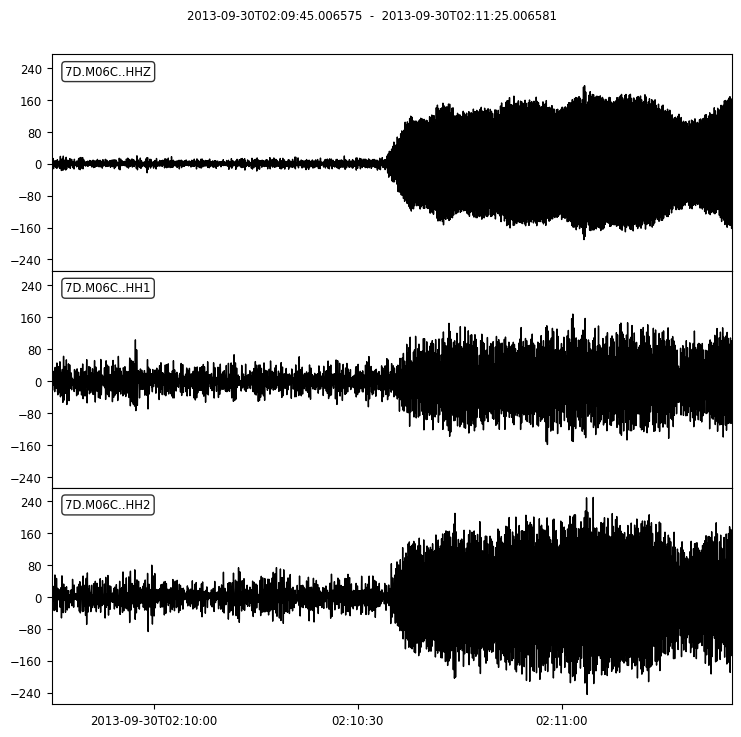

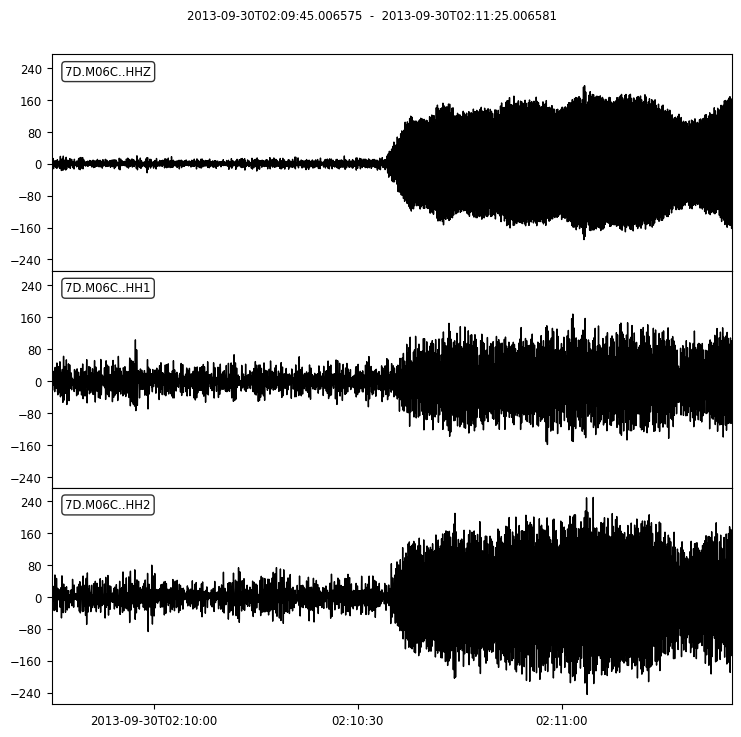

In [89]:
trim_s_M06C = s_M06C.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_M06C.plot()

## Test Station FN02C

In [90]:
s_FN02C = client.get_waveforms(network="7D", station="FN02C", channel="?H?", year=2013, month=9, day=30)
s_FN02C

3 Trace(s) in Stream:
7D.FN02C..HH1 | 2013-09-30T00:00:00.001500Z - 2013-09-30T23:59:59.993500Z | 125.0 Hz, 10800000 samples
7D.FN02C..HH2 | 2013-09-30T00:00:00.001500Z - 2013-09-30T23:59:59.993500Z | 125.0 Hz, 10800000 samples
7D.FN02C..HHZ | 2013-09-30T00:00:00.001500Z - 2013-09-30T23:59:59.993500Z | 125.0 Hz, 10800000 samples

In [91]:
s_FN02C.filter(type='bandpass',freqmin=4,freqmax=15)

3 Trace(s) in Stream:
7D.FN02C..HH1 | 2013-09-30T00:00:00.001500Z - 2013-09-30T23:59:59.993500Z | 125.0 Hz, 10800000 samples
7D.FN02C..HH2 | 2013-09-30T00:00:00.001500Z - 2013-09-30T23:59:59.993500Z | 125.0 Hz, 10800000 samples
7D.FN02C..HHZ | 2013-09-30T00:00:00.001500Z - 2013-09-30T23:59:59.993500Z | 125.0 Hz, 10800000 samples

In [92]:
all_picks, all_detections = model.classify(s_FN02C)

In [93]:
for p in all_picks:
    print(p)

7D.FN02C.	2013-09-30T00:32:43.771500Z	P
7D.FN02C.	2013-09-30T00:32:46.121500Z	S
7D.FN02C.	2013-09-30T01:08:57.021500Z	S
7D.FN02C.	2013-09-30T02:31:38.641500Z	P
7D.FN02C.	2013-09-30T02:31:38.701500Z	S
7D.FN02C.	2013-09-30T05:45:10.701500Z	P
7D.FN02C.	2013-09-30T05:45:12.651500Z	P
7D.FN02C.	2013-09-30T05:45:12.761500Z	S
7D.FN02C.	2013-09-30T06:02:14.531500Z	P
7D.FN02C.	2013-09-30T06:02:18.911500Z	S
7D.FN02C.	2013-09-30T06:47:07.331500Z	P
7D.FN02C.	2013-09-30T06:47:10.011500Z	S
7D.FN02C.	2013-09-30T06:47:54.911500Z	S
7D.FN02C.	2013-09-30T08:13:58.711500Z	P
7D.FN02C.	2013-09-30T08:13:59.371500Z	S
7D.FN02C.	2013-09-30T08:20:36.521500Z	S
7D.FN02C.	2013-09-30T09:58:50.901500Z	P
7D.FN02C.	2013-09-30T09:58:51.341500Z	S
7D.FN02C.	2013-09-30T12:42:41.531500Z	P
7D.FN02C.	2013-09-30T12:42:42.811500Z	S
7D.FN02C.	2013-09-30T13:55:41.971500Z	P
7D.FN02C.	2013-09-30T13:55:43.591500Z	S
7D.FN02C.	2013-09-30T14:15:35.001500Z	P
7D.FN02C.	2013-09-30T14:45:51.721500Z	P
7D.FN02C.	2013-09-30T14:45:53.781500Z	S


In [94]:
index = 0 # you can change this accordingly 
pick = all_picks[index]

print(f"This {pick.phase} phase is picked at {pick.peak_time}")

This P phase is picked at 2013-09-30T00:32:43.771500Z


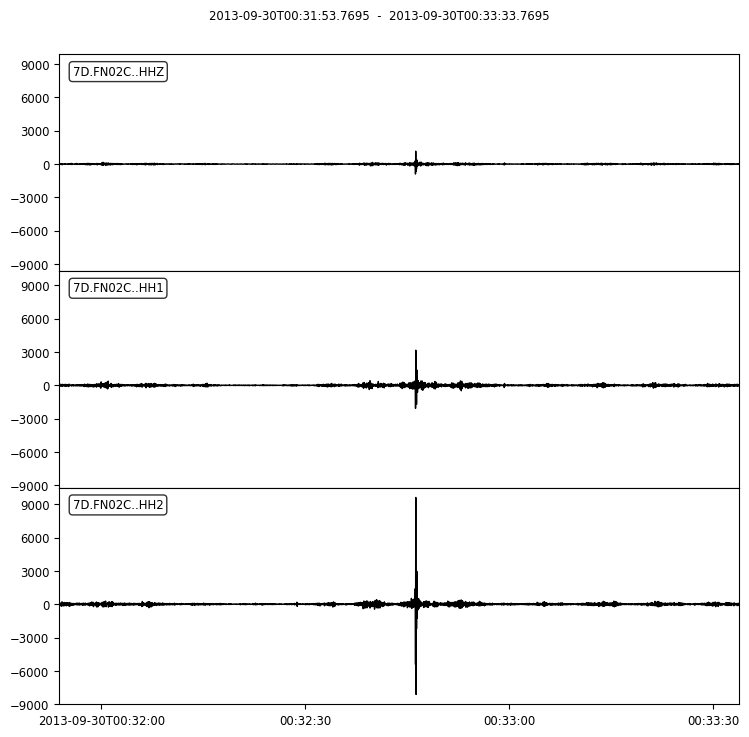

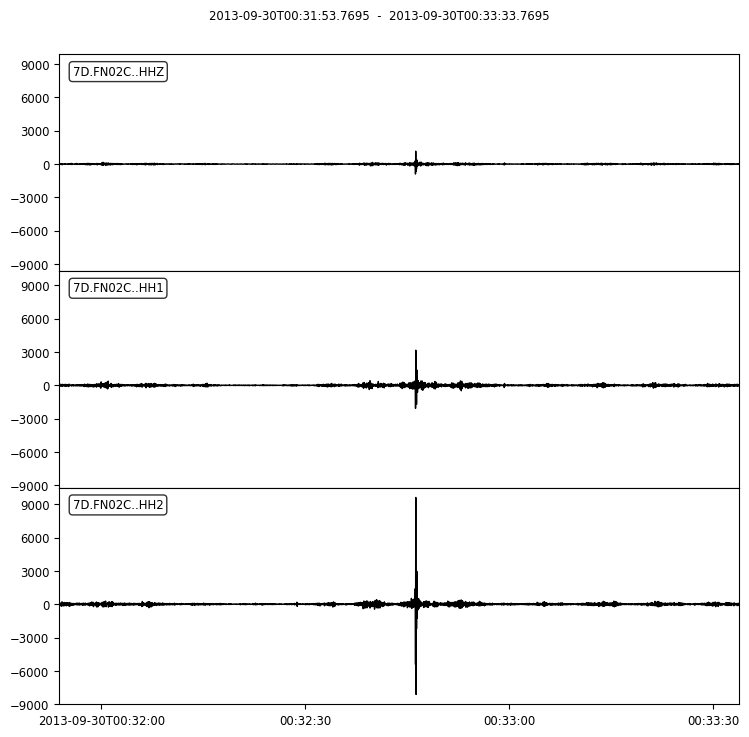

In [95]:
trim_s_FN02C= s_FN02C.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_FN02C.plot()

## Test Station J41A

In [ ]:
s_J41A = client.get_waveforms(network="7D", station="J41A", channel="?H?", year=2012, month=7, day=1)
s_J41A

In [77]:
all_picks, all_detections = model.classify(s_FS16B)

In [78]:
for p in all_picks:
    print(p)

7D.FS16B.	2012-09-30T00:26:41.992200Z	P
7D.FS16B.	2012-09-30T00:26:42.982200Z	P
7D.FS16B.	2012-09-30T00:26:44.852200Z	P
7D.FS16B.	2012-09-30T00:26:48.222200Z	S
7D.FS16B.	2012-09-30T00:27:13.552200Z	S
7D.FS16B.	2012-09-30T02:21:09.962200Z	P
7D.FS16B.	2012-09-30T02:21:12.232200Z	S
7D.FS16B.	2012-09-30T03:00:41.912200Z	P
7D.FS16B.	2012-09-30T03:00:43.952200Z	S
7D.FS16B.	2012-09-30T05:18:32.562200Z	P
7D.FS16B.	2012-09-30T05:34:21.362200Z	P
7D.FS16B.	2012-09-30T05:34:21.502200Z	S
7D.FS16B.	2012-09-30T05:41:35.002200Z	P
7D.FS16B.	2012-09-30T05:41:39.102200Z	S
7D.FS16B.	2012-09-30T06:19:54.402200Z	S
7D.FS16B.	2012-09-30T06:32:38.012200Z	P
7D.FS16B.	2012-09-30T06:32:46.452200Z	S
7D.FS16B.	2012-09-30T06:38:14.772200Z	S
7D.FS16B.	2012-09-30T06:38:49.112200Z	S
7D.FS16B.	2012-09-30T06:43:10.492200Z	S
7D.FS16B.	2012-09-30T10:30:05.002200Z	S
7D.FS16B.	2012-09-30T10:31:37.052200Z	P
7D.FS16B.	2012-09-30T10:31:37.242200Z	S
7D.FS16B.	2012-09-30T11:19:05.022200Z	P
7D.FS16B.	2012-09-30T11:19:06.372200Z	S


In [79]:
trim_s_FS16B = s_FS16B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_FS16B.plot()

IndexError: Empty stream object

## Test Station J41A

In [ ]:
s_J41A = client.get_waveforms(network="7D", station="J41A", channel="?H?", year=2012, month=7, day=1)
s_J41A

In [77]:
all_picks, all_detections = model.classify(s_FS16B)

In [78]:
for p in all_picks:
    print(p)

7D.FS16B.	2012-09-30T00:26:41.992200Z	P
7D.FS16B.	2012-09-30T00:26:42.982200Z	P
7D.FS16B.	2012-09-30T00:26:44.852200Z	P
7D.FS16B.	2012-09-30T00:26:48.222200Z	S
7D.FS16B.	2012-09-30T00:27:13.552200Z	S
7D.FS16B.	2012-09-30T02:21:09.962200Z	P
7D.FS16B.	2012-09-30T02:21:12.232200Z	S
7D.FS16B.	2012-09-30T03:00:41.912200Z	P
7D.FS16B.	2012-09-30T03:00:43.952200Z	S
7D.FS16B.	2012-09-30T05:18:32.562200Z	P
7D.FS16B.	2012-09-30T05:34:21.362200Z	P
7D.FS16B.	2012-09-30T05:34:21.502200Z	S
7D.FS16B.	2012-09-30T05:41:35.002200Z	P
7D.FS16B.	2012-09-30T05:41:39.102200Z	S
7D.FS16B.	2012-09-30T06:19:54.402200Z	S
7D.FS16B.	2012-09-30T06:32:38.012200Z	P
7D.FS16B.	2012-09-30T06:32:46.452200Z	S
7D.FS16B.	2012-09-30T06:38:14.772200Z	S
7D.FS16B.	2012-09-30T06:38:49.112200Z	S
7D.FS16B.	2012-09-30T06:43:10.492200Z	S
7D.FS16B.	2012-09-30T10:30:05.002200Z	S
7D.FS16B.	2012-09-30T10:31:37.052200Z	P
7D.FS16B.	2012-09-30T10:31:37.242200Z	S
7D.FS16B.	2012-09-30T11:19:05.022200Z	P
7D.FS16B.	2012-09-30T11:19:06.372200Z	S


In [79]:
trim_s_FS16B = s_FS16B.copy().trim(starttime = UTCDateTime(pick.peak_time) - 50, 
                endtime = UTCDateTime(pick.peak_time) + 50)
trim_s_FS16B.plot()

IndexError: Empty stream object